In [1]:
import pandas as pd

import matplotlib.pyplot as plt
from matplotlib import rc, rcParams
import seaborn as sns
from statsmodels.graphics.tsaplots import plot_pacf
from statsmodels.graphics.tsaplots import plot_acf
import statsmodels.api as sm
import plotly.offline
import plotly.graph_objects as go
from plotly.subplots import make_subplots
from IPython.display import Markdown
from statsmodels.tsa.seasonal import seasonal_decompose
!pip install pmdarima


Defaulting to user installation because normal site-packages is not writeable


In [4]:
from IPython.core.interactiveshell import InteractiveShell
InteractiveShell.ast_node_interactivity = "all"
import warnings
warnings.filterwarnings("ignore")

import pandas as pd
import datetime
import numpy as np
from matplotlib import pyplot as plt
import plotly.express as px
from plotly.offline import init_notebook_mode, iplot
init_notebook_mode(connected=True)
from statsmodels.tsa.seasonal import seasonal_decompose
from statsmodels.tsa.stattools import adfuller
from statsmodels.tsa.stattools import grangercausalitytests
from statsmodels.graphics.tsaplots import plot_acf, plot_pacf
from statsmodels.tsa.arima.model import ARIMA
from sklearn.metrics import mean_squared_error
from sklearn.preprocessing import MinMaxScaler
from math import sqrt
from statsmodels.tsa.holtwinters import ExponentialSmoothing


In [5]:
#Load Data

cpi = pd.read_csv('.\Data\inflation.csv')
unemp = pd.read_csv('./Data/unemployment.csv')
interest = pd.read_csv('./Data/Interest Rates-Long Term Bond Yields1960-2023.csv')
exports = pd.read_csv('./Data/Exports1960-2023.csv')

imports = pd.read_csv('./Data/Imports1960-2023.csv')

moneysupply = pd.read_csv('./Data/MoneySupply1986-2023.csv')

ppi = pd.read_csv('./Data/ProducerPriceIndex 1960-2022.csv')



In [6]:
#setting start and end start date

start_date = pd.to_datetime('1990-01', format='%Y-%m')
end_date = pd.to_datetime('2010-12', format='%Y-%m')

In [7]:
#converting the date of all the variables to correct format

unemp['DATE'] = pd.to_datetime(unemp['DATE'],format='%Y-%m')
cpi['DATE'] = pd.to_datetime(cpi['DATE'],format='%Y-%m')
interest['DATE']=pd.to_datetime(interest['DATE'])
exports['DATE']=pd.to_datetime(exports['DATE'])
imports['DATE']=pd.to_datetime(imports['DATE'])
moneysupply['DATE']=pd.to_datetime(moneysupply['DATE'])
ppi['DATE']=pd.to_datetime(ppi['DATE'])

In [8]:
#to subsetting data to  get data from 1990 to 2010

cpi_sub = cpi[(cpi['DATE']>=start_date)&(cpi['DATE']<=end_date)]
interest_sub = interest[(interest['DATE']>=start_date)&(interest['DATE']<=end_date)]
unemp_sub = unemp[(unemp['DATE']>=start_date)&(unemp['DATE']<=end_date)]
exports_sub = exports[(exports['DATE']>=start_date)&(exports['DATE']<=end_date)]
imports_sub = imports[(imports['DATE']>=start_date)&(imports['DATE']<=end_date)]
moneysupply_sub = moneysupply[(moneysupply['DATE']>=start_date)&(moneysupply['DATE']<=end_date)]
ppi_sub = ppi[(ppi['DATE']>=start_date)&(ppi['DATE']<=end_date)]

In [9]:
# Reset the indexes of the DataFrames

cpi_reset = cpi_sub.reset_index(drop=True)
unemp_reset = unemp_sub.reset_index(drop=True)
interest_reset = interest_sub.reset_index(drop=True)
exports_reset = exports_sub.reset_index(drop=True)
imports_reset = imports_sub.reset_index(drop=True)
moneysupply_reset = moneysupply_sub.reset_index(drop=True)
ppi_reset = ppi_sub.reset_index(drop=True)

In [10]:
#making it into a single dataframe

concatenated_df = pd.concat([cpi_reset[['DATE', 'inflation']], unemp_reset['unemployment'], interest_reset['IRLTLT01GBM156N'],
                          exports_reset['XTEXVA01GBM667S'], imports_reset['XTIMVA01GBM667S'], moneysupply_reset['MANMM101GBM189S'],ppi_reset['PIEAMP02GBM659N']], axis=1)


In [11]:
# renaming columns
new_column_names = {'IRLTLT01GBM156N': 'interest', 'XTEXVA01GBM667S': 'exports', 'XTIMVA01GBM667S': 'imports','MANMM101GBM189S':'moneysupply', 'PIEAMP02GBM659N':'ppi'}
concatenated_df = concatenated_df.rename(columns=new_column_names)
concatenated_df

,DATE,inflation,unemployment,interest,exports,imports,moneysupply,ppi
0,1990-01-01,5.9,6.8,10.8900,1.404238e+10,1.804408e+10,1.681660e+11,5.386733
1,1990-02-01,6.3,6.8,11.3300,1.429611e+10,1.767467e+10,1.693210e+11,5.371894
2,1990-03-01,6.2,6.7,12.4200,1.372672e+10,1.780426e+10,1.707170e+11,5.479455
3,1990-04-01,7.7,6.8,12.7400,1.417412e+10,1.806603e+10,1.715400e+11,6.267027
4,1990-05-01,8.2,6.7,12.4100,1.475232e+10,1.798045e+10,1.720790e+11,6.089312
...,...,...,...,...,...,...,...,...
247,2010-08-01,2.4,7.8,3.2330,3.435595e+10,4.692579e+10,1.098187e+12,4.217536
248,2010-09-01,2.4,7.9,3.1271,3.449105e+10,4.620309e+10,1.082137e+12,4.208195
249,2010-10-01,2.5,7.9,3.0685,3.543559e+10,4.820202e+10,1.094549e+12,4.520397
250,2010-11-01,2.6,7.9,3.3110,3.625446e+10,4.948086e+10,1.077534e+12,4.490690


<Figure size 800x400 with 0 Axes>

<Axes: >

<Axes: ylabel='inflation'>

Text(0.5, 1.0, 'inflation')

<Axes: >

<Axes: ylabel='unemployment'>

Text(0.5, 1.0, 'unemployment')

<Axes: >

<Axes: ylabel='interest'>

Text(0.5, 1.0, 'interest')

<Axes: >

<Axes: ylabel='exports'>

Text(0.5, 1.0, 'exports')

<Axes: >

<Axes: ylabel='imports'>

Text(0.5, 1.0, 'imports')

<Axes: >

<Axes: ylabel='moneysupply'>

Text(0.5, 1.0, 'moneysupply')

<Axes: >

<Axes: ylabel='ppi'>

Text(0.5, 1.0, 'ppi')

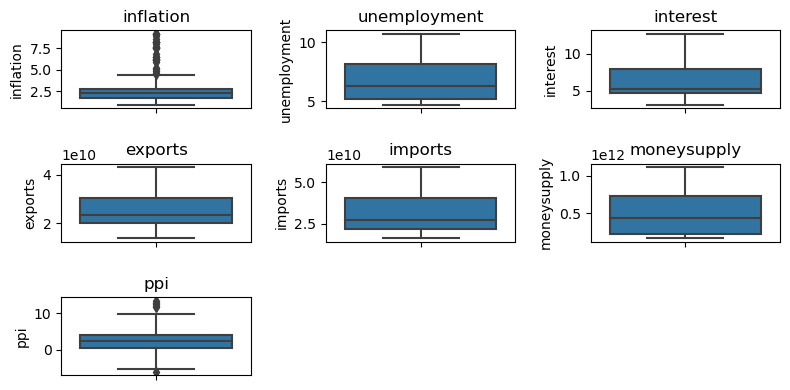

In [12]:
# Perform outlier analysis using boxplots for all the variables
plt.figure(figsize=(8, 4))

# List of columns for outlier analysis
cols = ['inflation', 'unemployment', 'interest', 'exports', 'imports', 'moneysupply', 'ppi']

# Loop to generate boxplots for each column
for i, col in enumerate(cols, 1):
    plt.subplot(3, 3, i)
    sns.boxplot(y=col, data=concatenated_df)
    plt.title(f'{col}')

plt.tight_layout()
plt.show()


In [13]:
concatenated_df.columns

Index(['DATE', 'inflation', 'unemployment', 'interest', 'exports', 'imports',
       'moneysupply', 'ppi'],
      dtype='object')

In [14]:
csv_data = concatenated_df.to_csv(index=False)

from IPython.core.display import display, HTML

# Convert the CSV string to a byte stream
import base64
csv_bytes = csv_data.encode('utf-8')
b64 = base64.b64encode(csv_bytes).decode()

# Create the HTML link
link = f'<a download="dataframe.csv" href="data:text/csv;base64,{b64}" target="_blank">Download CSV</a>'
display(HTML(link))

array([[<Axes: title={'center': 'Inflation'}>,
        <Axes: title={'center': 'Unemployment Rate'}>,
        <Axes: title={'center': 'interest rate'}>,
        <Axes: title={'center': 'exports'}>],
       [<Axes: title={'center': 'imports'}>,
        <Axes: title={'center': 'M2'}>,
        <Axes: title={'center': 'Producer Price Index'}>,
        <Axes: title={'center': 'Core CPI % Change MoM'}>],
       [<Axes: >, <Axes: >, <Axes: >, <Axes: >],
       [<Axes: >, <Axes: >, <Axes: >, <Axes: >]], dtype=object)

Text(0.5, 0.98, '32 Year Macroeconomic Indicators for the UK')

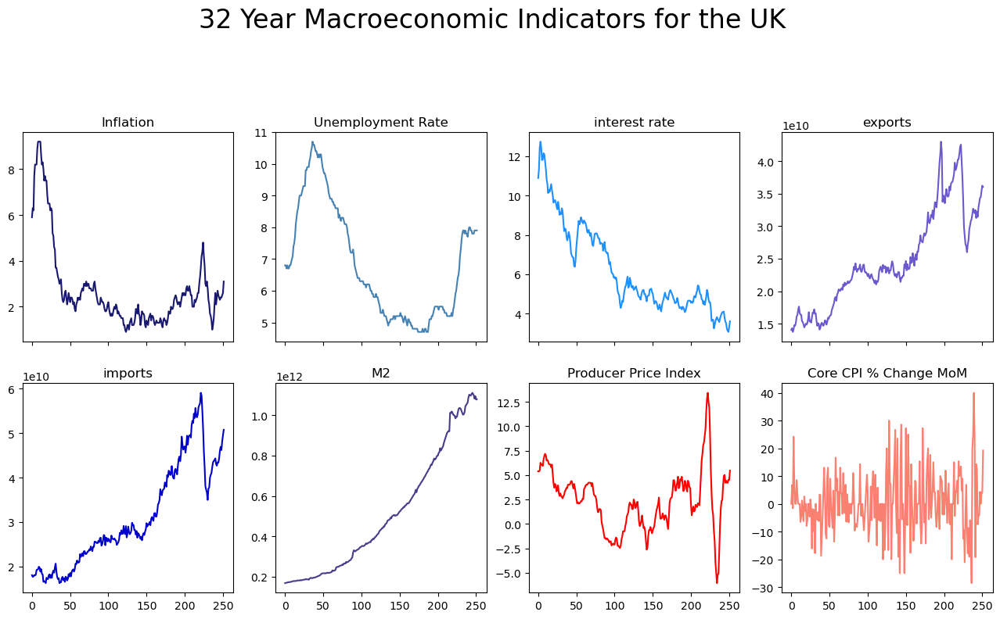

In [15]:
#visualizing the variables
copy_df = concatenated_df.copy()
copy_df['cpi_pct_mom'] = round((copy_df['inflation'].pct_change().fillna(0))*100,2)
copy_df['cpi_pct_yoy'] = round((copy_df['inflation'].pct_change(12).fillna(0))*100,2)

copy_df.iloc[:, 1:9].plot(kind ='line',
            subplots = True,
            figsize = (16,16),
            title = ['Inflation', 'Unemployment Rate','interest rate','exports','imports','M2',
                     'Producer Price Index','Core CPI % Change MoM'],
            legend = False,
            layout = (4,4),
            sharex = True,
            style = ['midnightblue', 'steelblue', 'dodgerblue', 'slateblue','mediumblue','darkslateblue','red','salmon','brown','maroon','tomato'])

plt.suptitle('32 Year Macroeconomic Indicators for the UK', fontsize = 24)

Text(0.5, 0, 'Date')

Text(0, 0.5, 'Inflation Rate')

Text(0.5, 1.0, 'Inflation Over Time')

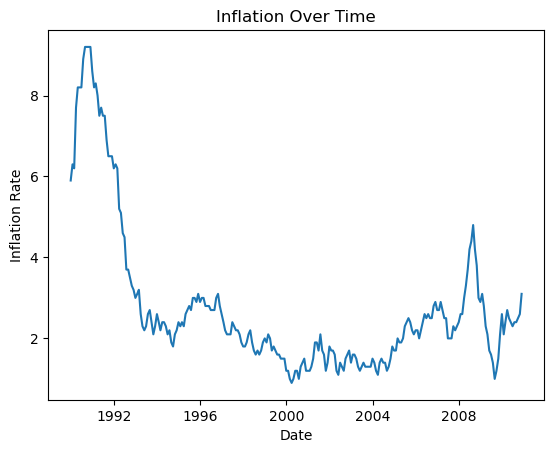

In [16]:
# Create the line graph
plt.plot(concatenated_df['DATE'], concatenated_df['inflation'])

# Customize the graph
plt.xlabel('Date')
plt.ylabel('Inflation Rate')
plt.title('Inflation Over Time')

# Display the graph
plt.show()

The line chart shows how the inflation has changed over time. The chart shows some peaks during begining of 1990 and and also during 2023 which needs to be investigated. In the intial phase of investigation the peak inflation during 2022 to 2023 may be due to Russia-Ukraine war.

In [17]:
concatenated_df['year'] = concatenated_df['DATE'].dt.year
concatenated_df['month'] = concatenated_df['DATE'].dt.month
concatenated_df

,DATE,inflation,unemployment,interest,exports,imports,moneysupply,ppi,year,month
0,1990-01-01,5.9,6.8,10.8900,1.404238e+10,1.804408e+10,1.681660e+11,5.386733,1990,1
1,1990-02-01,6.3,6.8,11.3300,1.429611e+10,1.767467e+10,1.693210e+11,5.371894,1990,2
2,1990-03-01,6.2,6.7,12.4200,1.372672e+10,1.780426e+10,1.707170e+11,5.479455,1990,3
3,1990-04-01,7.7,6.8,12.7400,1.417412e+10,1.806603e+10,1.715400e+11,6.267027,1990,4
4,1990-05-01,8.2,6.7,12.4100,1.475232e+10,1.798045e+10,1.720790e+11,6.089312,1990,5
...,...,...,...,...,...,...,...,...,...,...
247,2010-08-01,2.4,7.8,3.2330,3.435595e+10,4.692579e+10,1.098187e+12,4.217536,2010,8
248,2010-09-01,2.4,7.9,3.1271,3.449105e+10,4.620309e+10,1.082137e+12,4.208195,2010,9
249,2010-10-01,2.5,7.9,3.0685,3.543559e+10,4.820202e+10,1.094549e+12,4.520397,2010,10
250,2010-11-01,2.6,7.9,3.3110,3.625446e+10,4.948086e+10,1.077534e+12,4.490690,2010,11


<Axes: xlabel='month'>

Text(0.5, 0, 'month of the year')

Text(0, 0.5, 'Inflation')

Text(0.5, 1.0, 'Mean yearly Inflation')

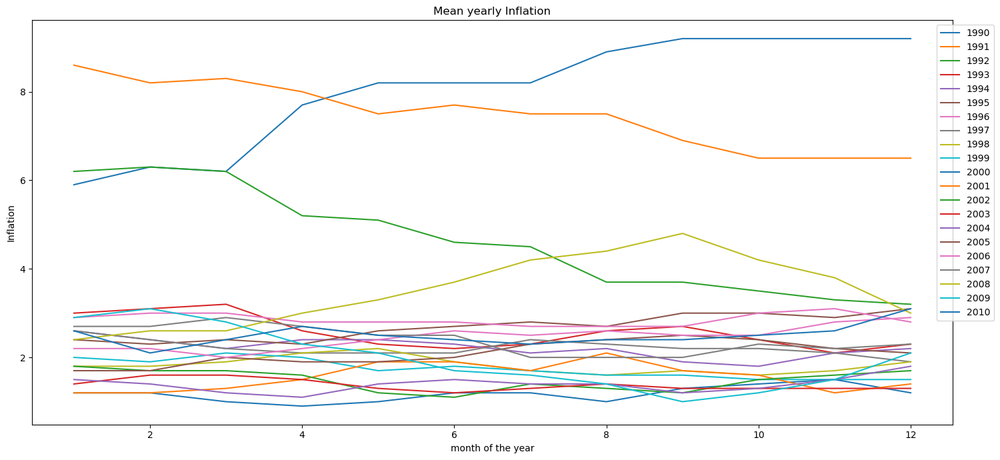

In [18]:
#studying yearly inflation

fig, axs = plt.subplots(1,1, figsize=(15,7))
concatenated_df.groupby(['year','month']).mean()['inflation'].unstack().T.plot(ax=axs)
# "how" is an important parameter above. We will discuss more about it later
axs.set_xlabel('month of the year')
axs.set_ylabel('Inflation')
axs.set_title('Mean yearly Inflation')
plt.legend(bbox_to_anchor=(1.05, 1))
fig.tight_layout()

<Axes: >

Text(0.5, 0, 'Year')

Text(0, 0.5, 'Total Inflation')

Text(0.5, 1.0, 'Inflation')

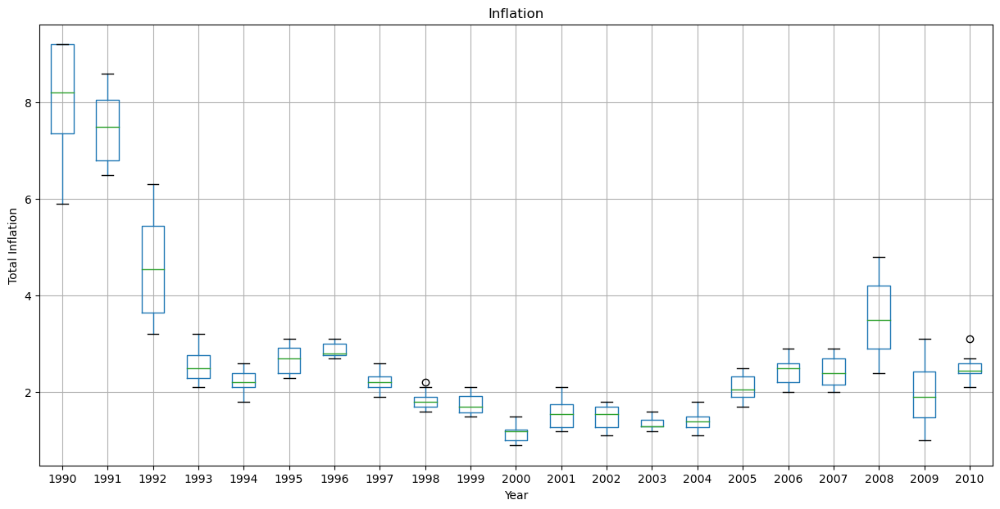

In [19]:
fig, axs = plt.subplots(1, 1, figsize=(15,7))    
concatenated_df.groupby(['year','month']).mean()['inflation'].unstack().T.boxplot(ax=axs)
axs.set_xlabel('Year')
axs.set_ylabel('Total Inflation')
axs.set_title('Inflation')

Text(0.5, 0, 'Date')

Text(0, 0.5, 'Rate')

Text(0.5, 1.0, 'Unemployment and CPI Over Time')

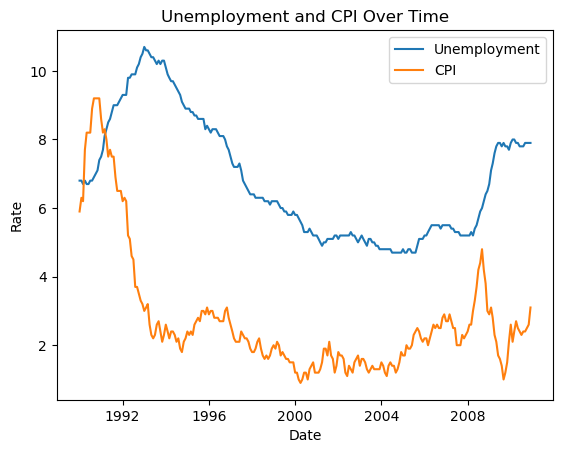

In [20]:
plt.plot(concatenated_df['DATE'], concatenated_df['unemployment'], label='Unemployment')
plt.plot(concatenated_df['DATE'], concatenated_df['inflation'], label='CPI')

# Customize the graph
plt.xlabel('Date')
plt.ylabel('Rate')
plt.title('Unemployment and CPI Over Time')
plt.legend()

# Display the graph
plt.show()

The dual axis line chart shows the how unemployment and inflation changes from 1990 to 2023. The plot seems to show that the two plots are  following each other. 

## Correlation between the variables

<Figure size 700x500 with 0 Axes>

<Axes: >

Text(0.5, 1.0, 'Correlation Plot')

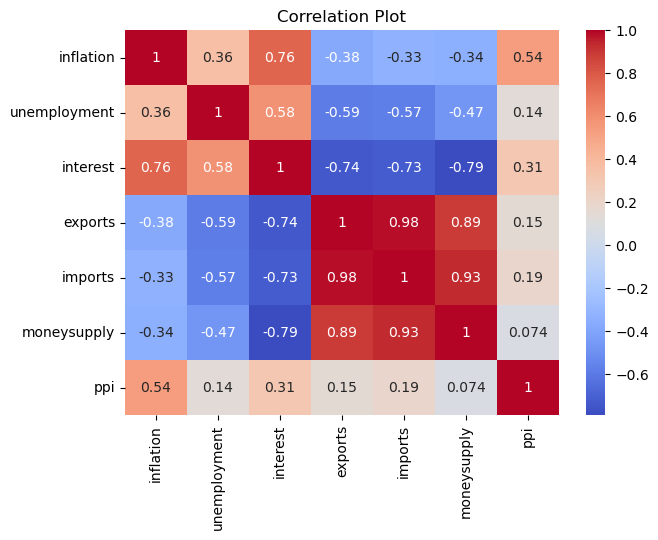

In [21]:
# correlation between the variables

selected_columns = ['inflation', 'unemployment','interest','exports','imports','moneysupply', 'ppi']

correlation_matrix = concatenated_df[selected_columns].corr()

plt.figure(figsize=(7, 5))
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm')

# Customize the plot
plt.title('Correlation Plot')
plt.show()







Correlation plot shows that there is a positive correlation of 0.17 between unemployment and inflation. But theoreticaly the relationship needs to be negative. So this needs to be investigated.

## Autocorrelation Plot

In [22]:
from statsmodels.graphics.tsaplots import plot_pacf
from statsmodels.graphics.tsaplots import plot_acf
import statsmodels.api as sm
import plotly.offline
import plotly.graph_objects as go
from plotly.subplots import make_subplots
from IPython.display import Markdown

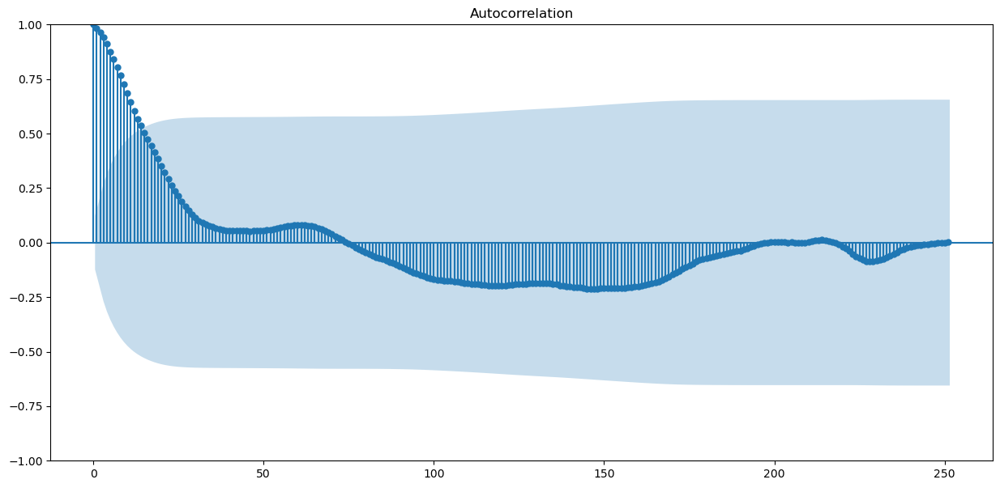

Text(0.5, 4.444444444444452, 'Lags')

Text(4.444444444444466, 0.5, 'Autocorrelation')

Text(0.5, 1.0, 'Autocorrelation of inflation')

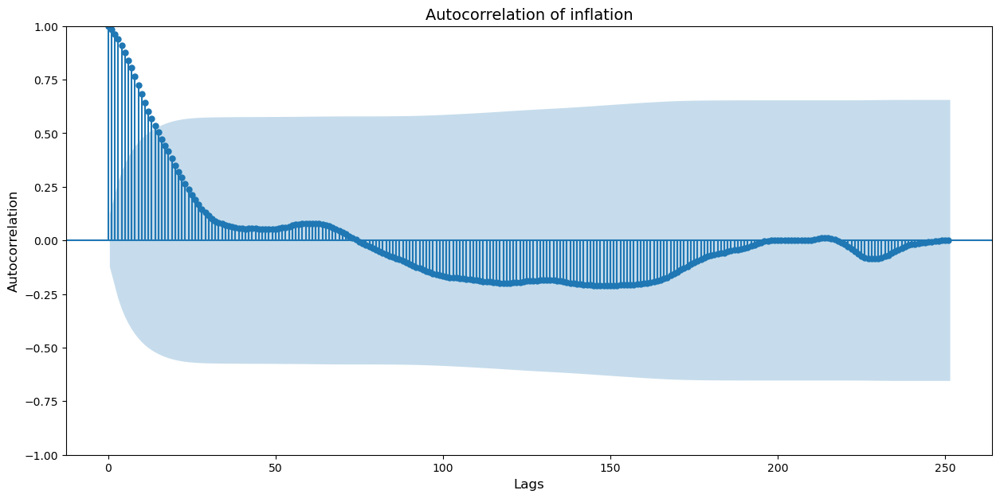

In [23]:
from statsmodels.graphics.tsaplots import plot_acf
import matplotlib.pyplot as plt

dfn = concatenated_df.set_index('DATE')
plt.rc("figure", figsize=(15, 7))
plot_acf(dfn.inflation, lags=len(dfn)-1)  # Set lags to the length of your data minus 1
plt.xlabel('Lags', fontsize=12)
plt.ylabel('Autocorrelation', fontsize=12)
plt.title('Autocorrelation of inflation', fontsize=14)
plt.show()


## Partial Auto Correlation Plot

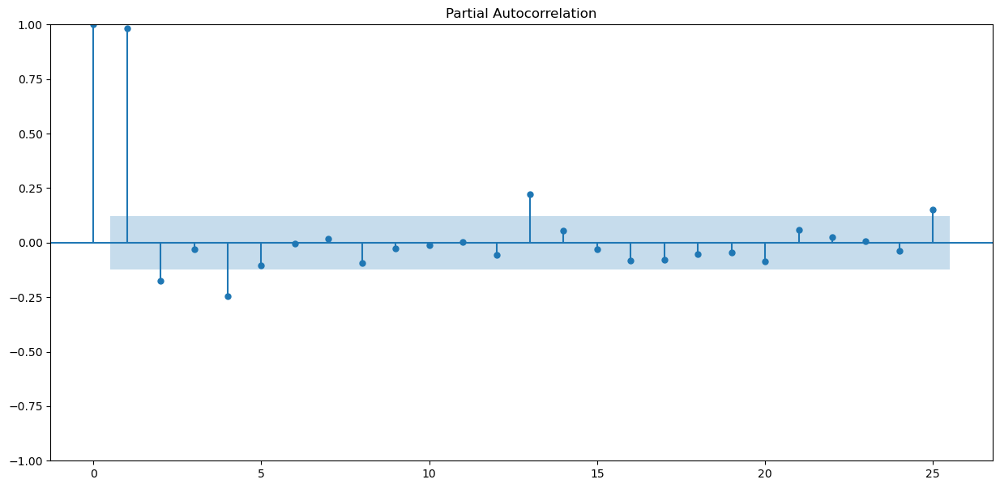

Text(0.5, 4.444444444444452, 'Lags')

Text(4.444444444444466, 0.5, 'Partial Autocorrelation')

Text(0.5, 1.0, 'Partial Autocorrelation of inflation')

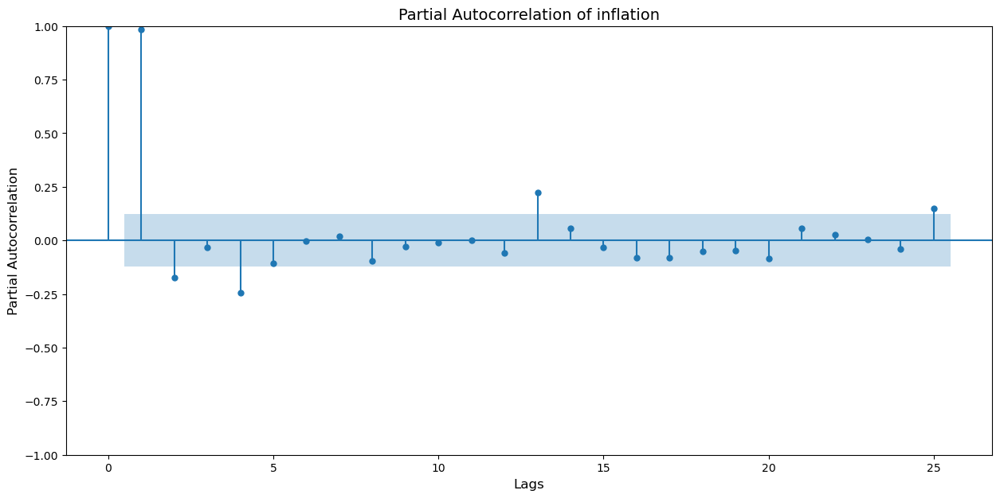

In [24]:

dfn = concatenated_df.set_index('DATE')
plt.rc("figure", figsize=(15, 7))
#plot_pacf(dfn.inflation, lags=int(len(concatenated_df)*0.5)-1)
# used ywm method as suggested in the warning to keep pacf within the limit [-1,1]
plot_pacf(dfn['inflation'], method='ywm')
plt.xlabel('Lags', fontsize=12)
plt.ylabel('Partial Autocorrelation', fontsize=12)
plt.title('Partial Autocorrelation of inflation', fontsize=14)
plt.show()


## Finding the Trend

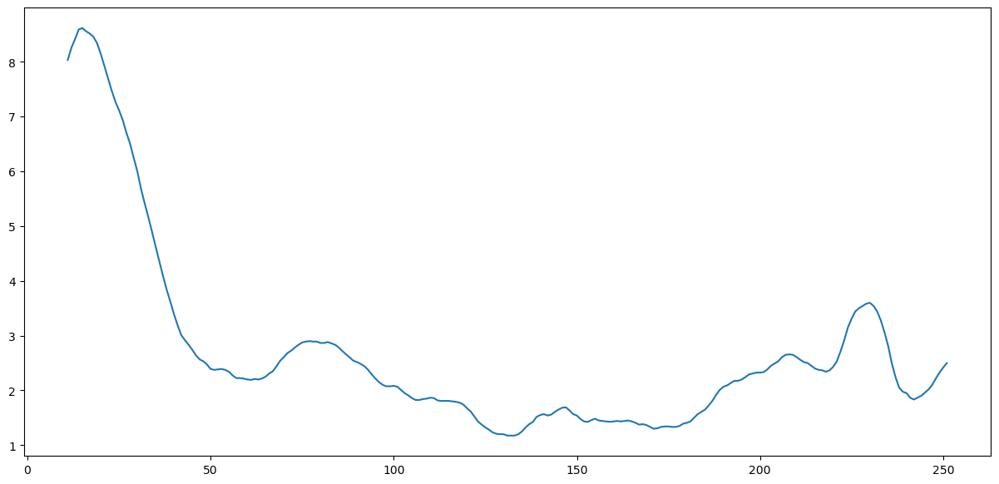

In [25]:

mm = concatenated_df.inflation.rolling(12).mean()
plt.plot(mm)


In [26]:
from pathlib import Path
from warnings import simplefilter
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd

simplefilter("ignore")  

plt.style.use("seaborn-whitegrid")
plt.rc("figure", autolayout=True, figsize=(11, 5))
plt.rc("axes",labelweight="bold",labelsize="large",titleweight="bold",titlesize=14,titlepad=10)
plot_params = dict(color="0.75",style=".-",markeredgecolor="0.25",markerfacecolor="0.25",legend=False)
%config InlineBackend.figure_format = 'retina'

<Axes: xlabel='DATE'>

<Axes: title={'center': 'Inflation - 12-Month Moving Average'}, xlabel='DATE'>

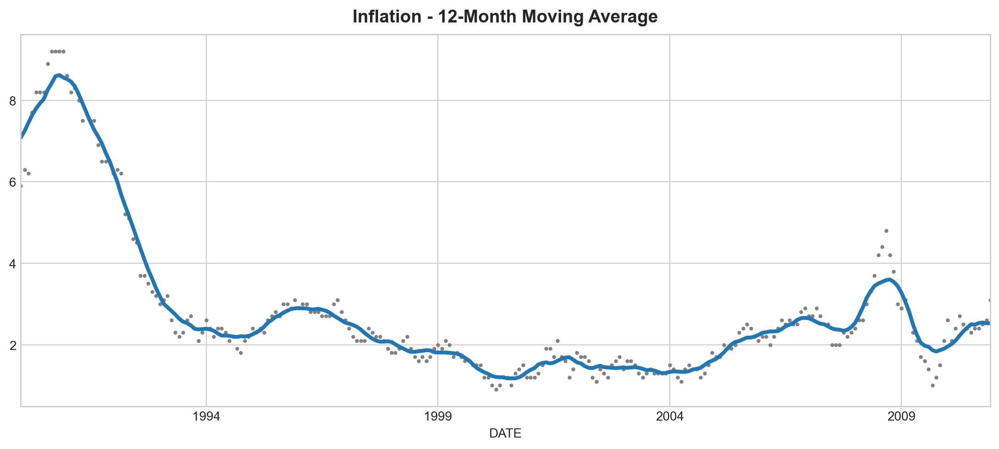

In [27]:
import matplotlib.pyplot as plt

moving_average = dfn['inflation'].rolling(
    window=12,       # 12-month window
    center=True,     # puts the average at the center of the window
    min_periods=6    # choose about half the window size
).mean()            # compute the mean (could also do median, std, min, max, ...)

fig, ax = plt.subplots()
dfn['inflation'].plot(style=".", color="0.5", marker='o', markersize=2, ax=ax)
moving_average.plot(ax=ax, linewidth=3, title="Inflation - 12-Month Moving Average", legend=False)

plt.show()


In [28]:
dfn['inflation'].index

DatetimeIndex(['1990-01-01', '1990-02-01', '1990-03-01', '1990-04-01',
               '1990-05-01', '1990-06-01', '1990-07-01', '1990-08-01',
               '1990-09-01', '1990-10-01',
               ...
               '2010-03-01', '2010-04-01', '2010-05-01', '2010-06-01',
               '2010-07-01', '2010-08-01', '2010-09-01', '2010-10-01',
               '2010-11-01', '2010-12-01'],
              dtype='datetime64[ns]', name='DATE', length=252, freq=None)

In [29]:
from statsmodels.tsa.deterministic import DeterministicProcess
dp = DeterministicProcess(
    index=dfn.index,  # dates from the training data
    constant=True,       # dummy feature for the bias (y_intercept)
    order=3,             # the time dummy (trend)
    drop=True,           # drop terms if necessary to avoid collinearity
)
# `in_sample` creates features for the dates given in the `index` argument
X = dp.in_sample()
X.head()

,const,trend,trend_squared,trend_cubed
DATE,,,,
1990-01-01,1.0,1.0,1.0,1.0
1990-02-01,1.0,2.0,4.0,8.0
1990-03-01,1.0,3.0,9.0,27.0
1990-04-01,1.0,4.0,16.0,64.0
1990-05-01,1.0,5.0,25.0,125.0


In [30]:
from sklearn.linear_model import LinearRegression
y = dfn["inflation"]  # the target
# The intercept is the same as the `const` feature from DeterministicProcess. LinearRegression behaves badly with duplicated features, so we need to be sure to exclude it here.
model = LinearRegression(fit_intercept=False)
model.fit(X, y)
y_pred = pd.Series(model.predict(X), index=X.index)

LinearRegression(fit_intercept=False)

In [31]:
y_pred

DATE
1990-01-01    8.653910
1990-02-01    8.506297
1990-03-01    8.360576
1990-04-01    8.216735
1990-05-01    8.074764
                ...   
2010-08-01    2.439917
2010-09-01    2.426187
2010-10-01    2.411638
2010-11-01    2.396259
2010-12-01    2.380040
Length: 252, dtype: float64

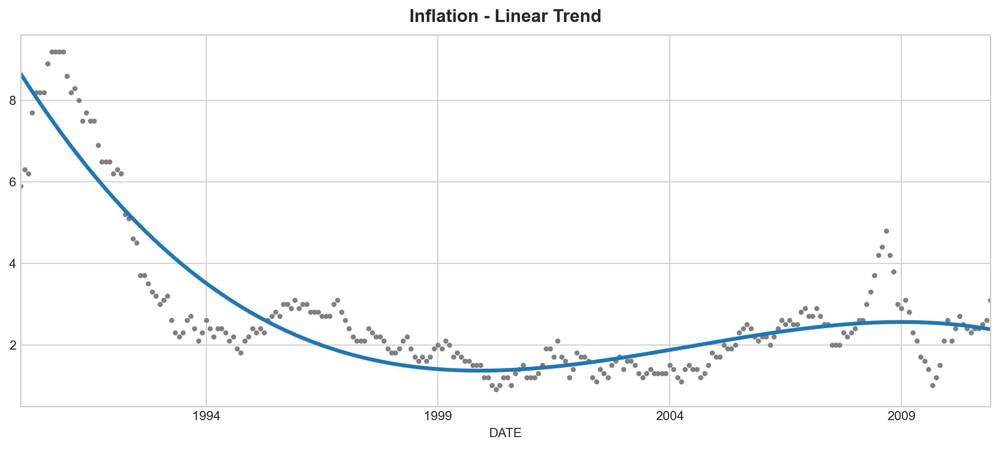

In [32]:
ax = dfn['inflation'].plot(style=".", color="0.5", title="Inflation - Linear Trend")
_ = y_pred.plot(ax=ax, linewidth=3, label="Trend")

In [33]:



forecast_period = pd.date_range(start=dfn.index[-1], periods=10, freq=dfn.index.inferred_freq)
X = dp.out_of_sample(steps=10)
X.index = forecast_period

X.head()

,const,trend,trend_squared,trend_cubed
2010-12-01,1.0,253.0,64009.0,16194277.0
2011-01-01,1.0,254.0,64516.0,16387064.0
2011-02-01,1.0,255.0,65025.0,16581375.0
2011-03-01,1.0,256.0,65536.0,16777216.0
2011-04-01,1.0,257.0,66049.0,16974593.0


In [34]:


y_fore = pd.Series(model.predict(X), index=X.index)
y_fore.head()

2010-12-01    2.362970
2011-01-01    2.345037
2011-02-01    2.326230
2011-03-01    2.306540
2011-04-01    2.285953
Freq: MS, dtype: float64

In [35]:
y_pred

DATE
1990-01-01    8.653910
1990-02-01    8.506297
1990-03-01    8.360576
1990-04-01    8.216735
1990-05-01    8.074764
                ...   
2010-08-01    2.439917
2010-09-01    2.426187
2010-10-01    2.411638
2010-11-01    2.396259
2010-12-01    2.380040
Length: 252, dtype: float64

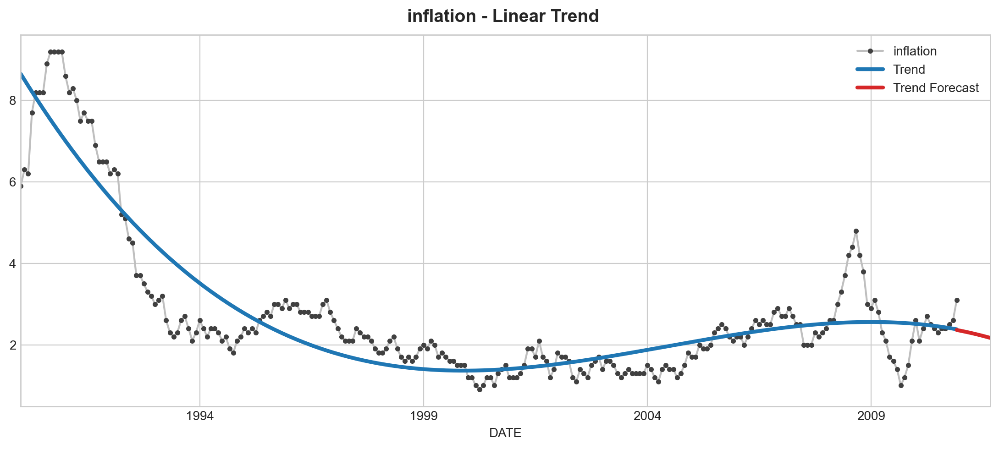

In [36]:
ax = dfn['inflation']["1990-01-01":].plot(title="inflation - Linear Trend ", **plot_params)
ax = y_pred["1990-01-01":].plot(ax=ax, linewidth=3, label="Trend")
ax = y_fore.plot(ax=ax, linewidth=3, label = "Trend Forecast", color="C3")
_ = ax.legend()

In [37]:
import numpy as np

def fourier_features(index, freq, order):
    time = np.arange(len(index), dtype=np.float32)
    k = 2 * np.pi * (1 / freq) * time
    features = {}
    for i in range(1, order + 1):
        features.update({
            f"sin_{freq}_{i}": np.sin(i * k),
            f"cos_{freq}_{i}": np.cos(i * k),
        })
    return pd.DataFrame(features, index=index)


In [38]:
from pathlib import Path
from warnings import simplefilter
import matplotlib.pyplot as plt
import pandas as pd
import seaborn as sns
from sklearn.linear_model import LinearRegression
from statsmodels.tsa.deterministic import CalendarFourier, DeterministicProcess

simplefilter("ignore")

# Set Matplotlib defaults
plt.style.use("seaborn-whitegrid")
plt.rc("figure", autolayout=True, figsize=(11, 5))
plt.rc("axes",labelweight="bold",labelsize="large",titleweight="bold",titlesize=16,titlepad=10)
plot_params = dict(color="0.75",style=".-",markeredgecolor="0.25",markerfacecolor="0.25",legend=False)
%config InlineBackend.figure_format = 'retina'


# annotations: https://stackoverflow.com/a/49238256/5769929
def seasonal_plot(X, y, period, freq, ax=None):
    if ax is None:
        _, ax = plt.subplots()
    palette = sns.color_palette("husl", n_colors=X[period].nunique(),)
    ax = sns.lineplot(x=freq,y=y,hue=period,data=X,ci=False,ax=ax,palette=palette,legend=False)
    ax.set_title(f"Seasonal Plot ({period}/{freq})")
    for line, name in zip(ax.lines, X[period].unique()):
        y_ = line.get_ydata()[-1]
        ax.annotate(name,xy=(1, y_),xytext=(6, 0),color=line.get_color(),xycoords=ax.get_yaxis_transform(),
            textcoords="offset points",size=14,va="center")
    return ax


def plot_periodogram(ts, detrend='linear', ax=None):
    from scipy.signal import periodogram
    fs = pd.Timedelta("1Y")/pd.Timedelta("1D")
    freqencies, spectrum = periodogram(ts,fs=fs,detrend=detrend,window="boxcar",scaling='spectrum')
    if ax is None:
        _, ax = plt.subplots()
    ax.step(freqencies, spectrum, color="purple")
    ax.set_xscale("log")
    ax.set_xticks([1, 2, 4, 6, 12, 26, 52, 104])
    ax.set_xticklabels(["Annual (1)","Semiannual (2)","Quarterly (4)","Bimonthly (6)","Monthly (12)",
        "Biweekly (26)","Weekly (52)","Semiweekly (104)",],rotation=30)
    ax.ticklabel_format(axis="y", style="sci", scilimits=(0,0))
    ax.set_ylabel("Variance")
    ax.set_title("Periodogram")
    return ax

In [39]:
dfs = concatenated_df.set_index('DATE').to_period("D")


In [40]:
X = dfs.copy()
# days within a week
X["day"] = X.index.dayofweek  # the x-axis (freq)
X["week"] = X.index.week  # the seasonal period (period)
# days within a year
X["dayofyear"] = X.index.dayofyear
X["year"] = X.index.year
X.head()

,inflation,unemployment,interest,exports,imports,moneysupply,ppi,year,month,day,week,dayofyear
DATE,,,,,,,,,,,,
1990-01-01,5.9,6.8,10.89,1.404238e+10,1.804408e+10,1.681660e+11,5.386733,1990,1,0,1,1
1990-02-01,6.3,6.8,11.33,1.429611e+10,1.767467e+10,1.693210e+11,5.371894,1990,2,3,5,32
1990-03-01,6.2,6.7,12.42,1.372672e+10,1.780426e+10,1.707170e+11,5.479455,1990,3,3,9,60
1990-04-01,7.7,6.8,12.74,1.417412e+10,1.806603e+10,1.715400e+11,6.267027,1990,4,6,13,91
1990-05-01,8.2,6.7,12.41,1.475232e+10,1.798045e+10,1.720790e+11,6.089312,1990,5,1,18,121


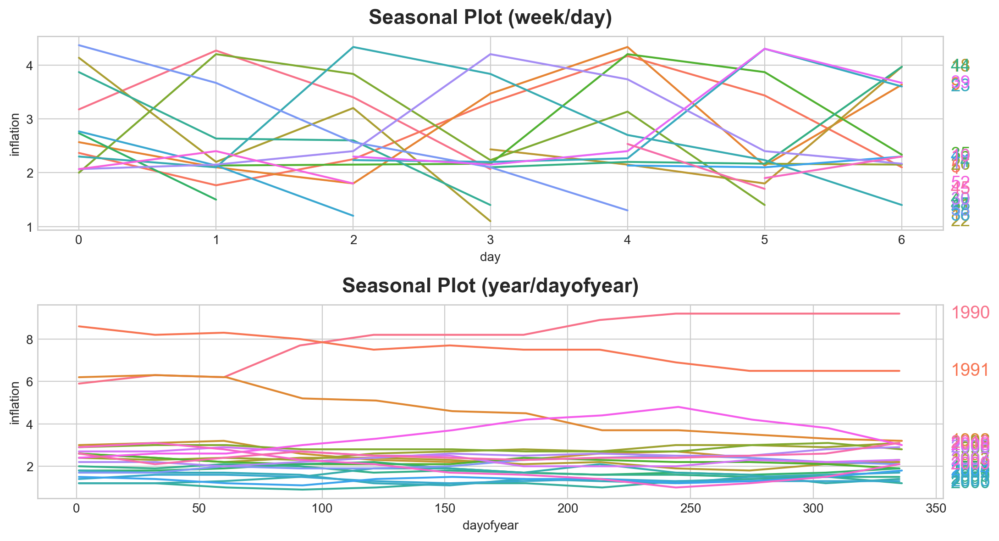

In [41]:
fig, (ax0, ax1) = plt.subplots(2, 1, figsize=(11, 6))
seasonal_plot(X, y="inflation", period="week", freq="day", ax=ax0)
seasonal_plot(X, y="inflation", period="year", freq="dayofyear", ax=ax1);

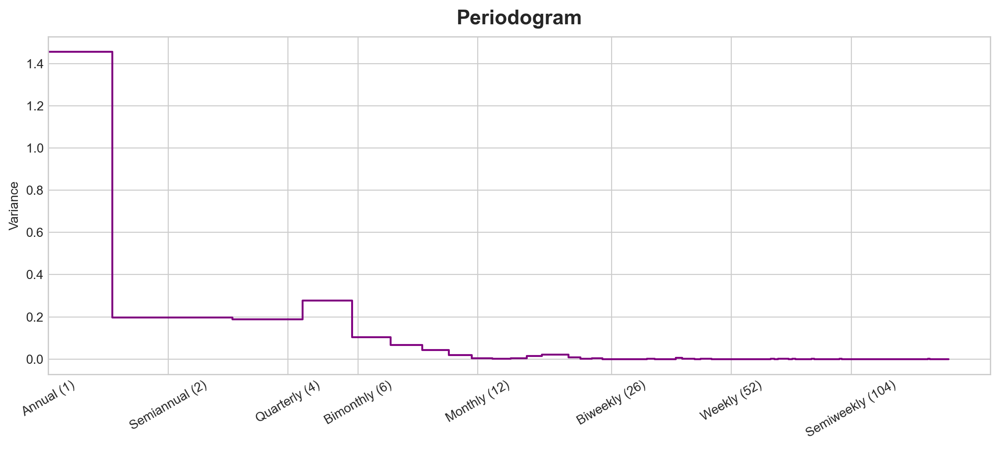

In [42]:
plot_periodogram(dfs.inflation);

## Fitting Arima model

### Decomposition of Time Series

<Axes: xlabel='DATE'>

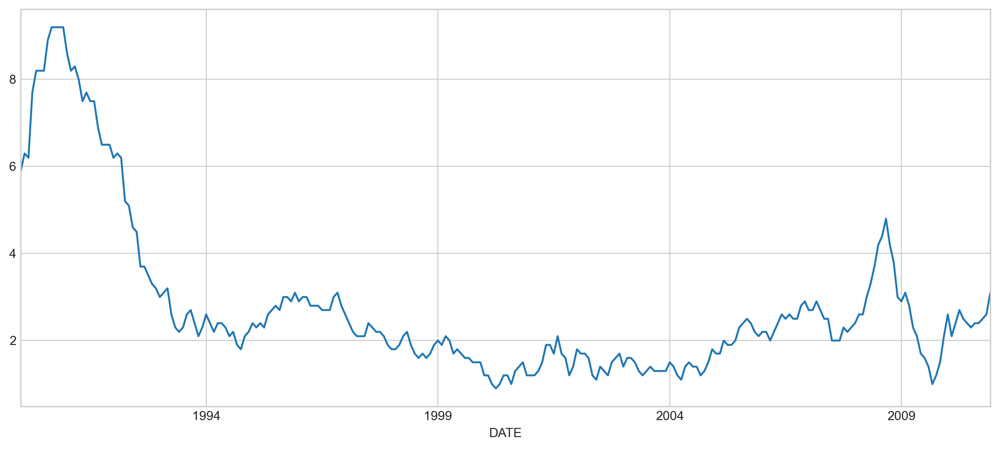

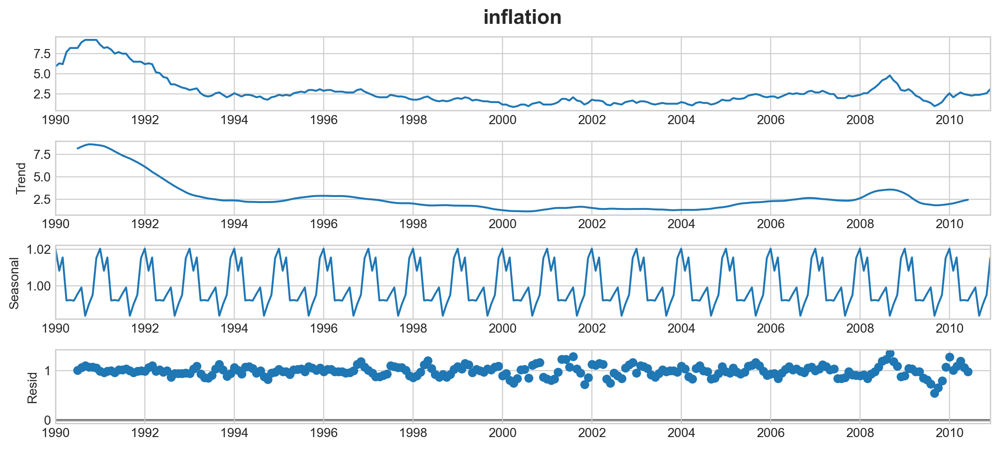

In [43]:


dfn['inflation'].plot()
fig = seasonal_decompose(dfn['inflation'], model='multiplicative').plot()

### Checking Stationarity

In [44]:
def adf_test(df):
    result = adfuller(df.values)
    if result[1] > 0.05:
        print("Series is not stationary")
    else:
        print("Series is stationary")

        
#chceking the stationariuty of the whole dataset
adf_test(dfn['inflation'])

Series is stationary


<Axes: xlabel='DATE'>

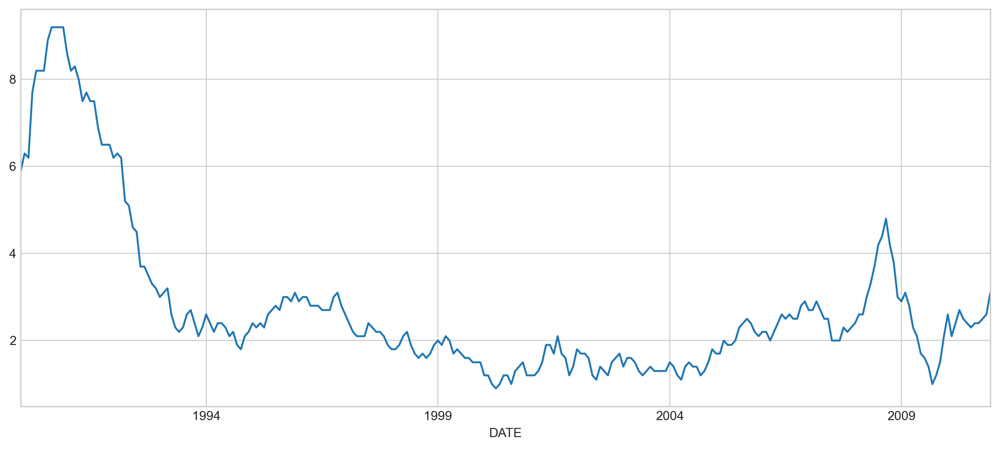

In [45]:
dfn['inflation'].plot()

### splitting the data

Training dataset: 240, Test dataset: 12


<Axes: xlabel='DATE'>

<Axes: xlabel='DATE'>

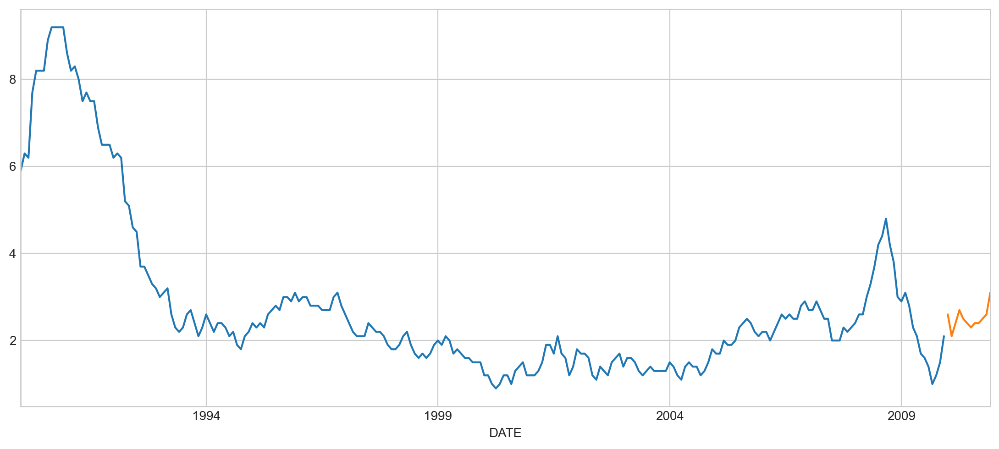

In [46]:
#splitting the data into train(1990jan to 2009 December)

split_point = len(dfn) - 12
train, test = dfn[0:split_point], dfn[split_point:]
print('Training dataset: %d, Test dataset: %d' % (len(train), len(test)))
train['inflation'].plot()
test['inflation'].plot()

In [47]:
#Checking the stationarity of train data

adf_test(train['inflation'])

Series is stationary


Here we can see a dip in the year 2020 due to pandemic and inflation was high during 1992 which was confirmed was caused primarily due to high-interest rates, falling house prices and an overvalued exchange rate. Membership of the Exchange Rate Mechanism (1990-1992) was a key factor in keeping interest rates higher than desirable.

### Differencing
Here, we are finding the number of optimal differencing to remove unit root so that the time-series is stationary. This is done by using diff() function and testing it with Augmented Dickey-Fuller test.



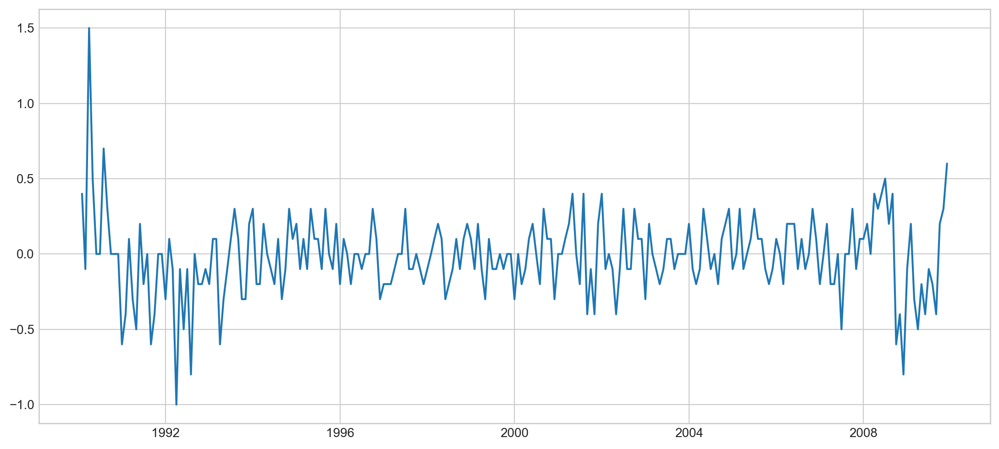

In [48]:
diff = train['inflation'].diff()
plt.plot(diff)
plt.show()
diff = diff.dropna()



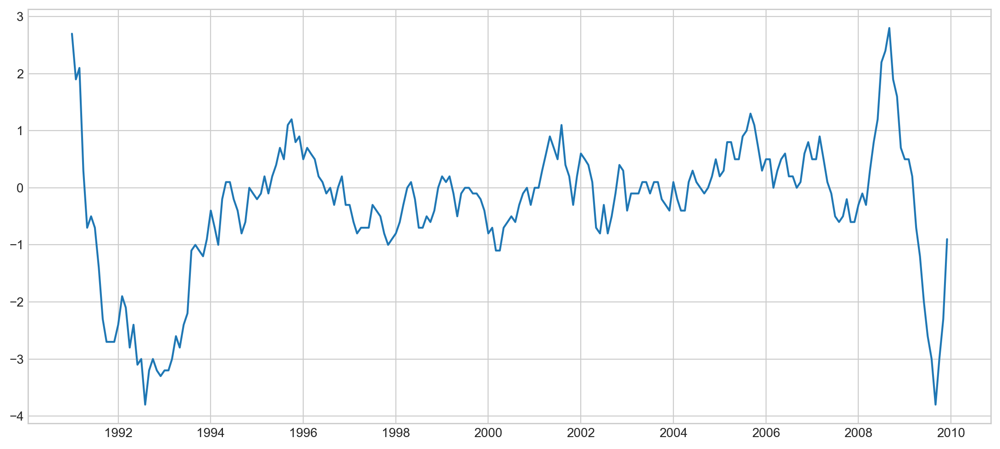

In [49]:


# Seasonal difference with a lag of 12 (e.g., for monthly data with yearly seasonality)
seasonal_diff = train['inflation'].diff(12)
plt.plot(seasonal_diff)
plt.show()

<Axes: title={'center': 'Periodogram'}, ylabel='Variance'>

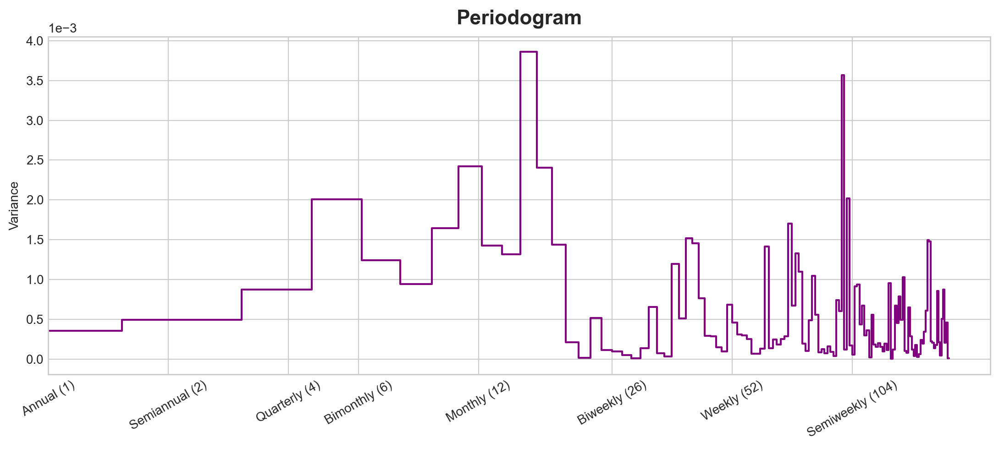

In [50]:
plot_periodogram(diff)

In [51]:
# perform KPSS test
from statsmodels.tsa.stattools import kpss
kpss_stat, p_value, lags, critical_values = kpss(diff, regression='c')

print(f'KPSS Statistic: {kpss_stat}')
print(f'p-value: {p_value}')
print(f'num lags: {lags}')
print('Critical Values:')
for key, value in critical_values.items():
    print(f'   {key} : {value}')

# interpret the KPSS statistic
if p_value < 0.05:
    print('Series is not stationary')
else:
    print('Series is stationary')

KPSS Statistic: 0.14505377965891325
p-value: 0.1
num lags: 5
Critical Values:
   10% : 0.347
   5% : 0.463
   2.5% : 0.574
   1% : 0.739
Series is stationary


###  ACF and PACF plot of  differenced train data to get the arima orders

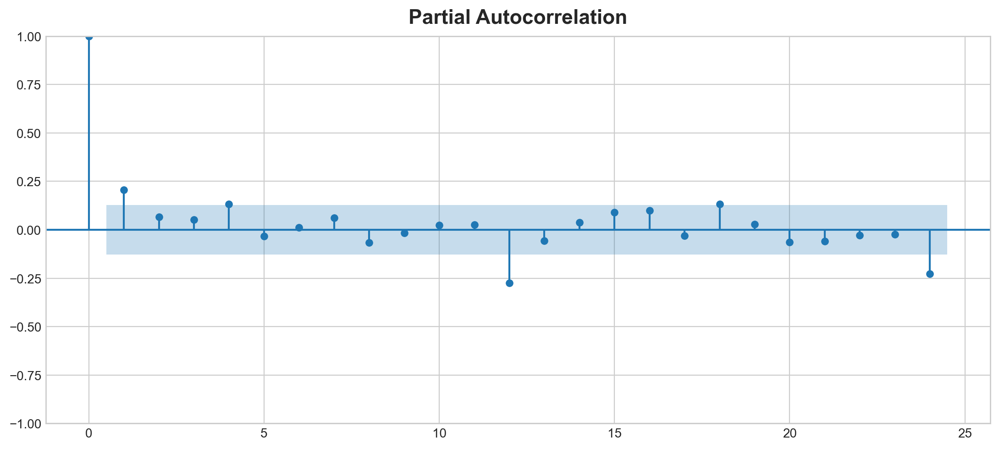

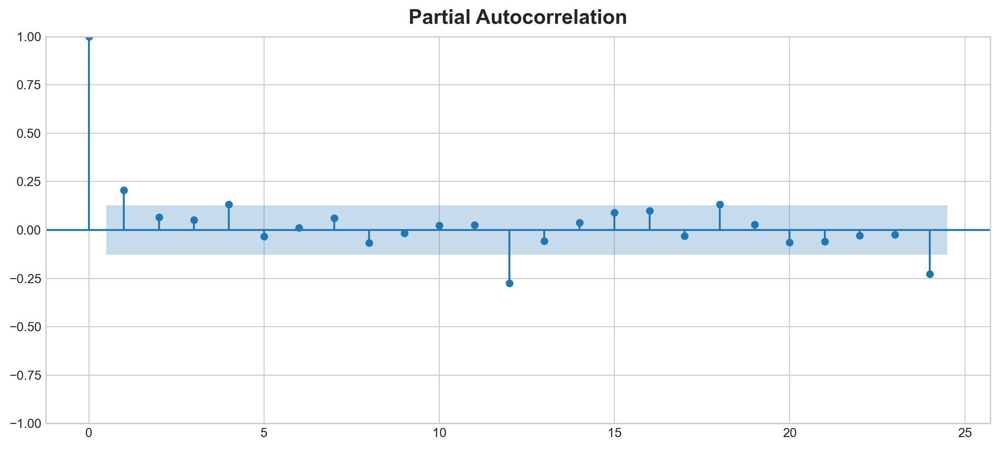

In [52]:
plot_pacf(diff.values)


Here in pacf plot we have a spike at lag 1 so we came to the conclusion that Auto Regressive term would be 1. So p will be 1

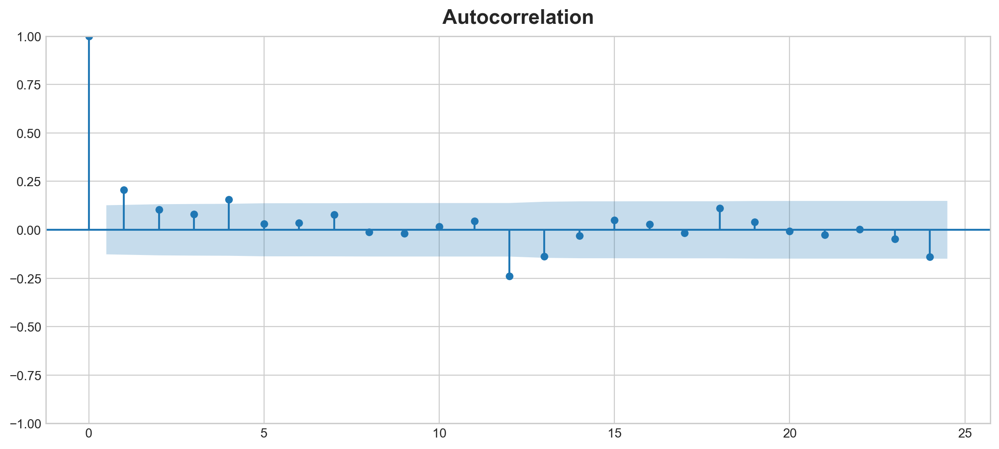

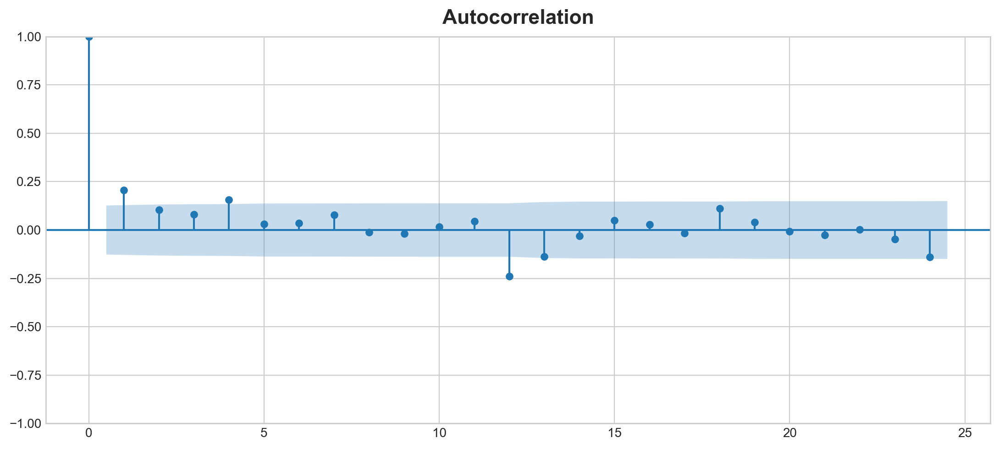

In [53]:
plot_acf(diff.values)

###  ACF and PACF plot of  non differenced train data to get the arima orders

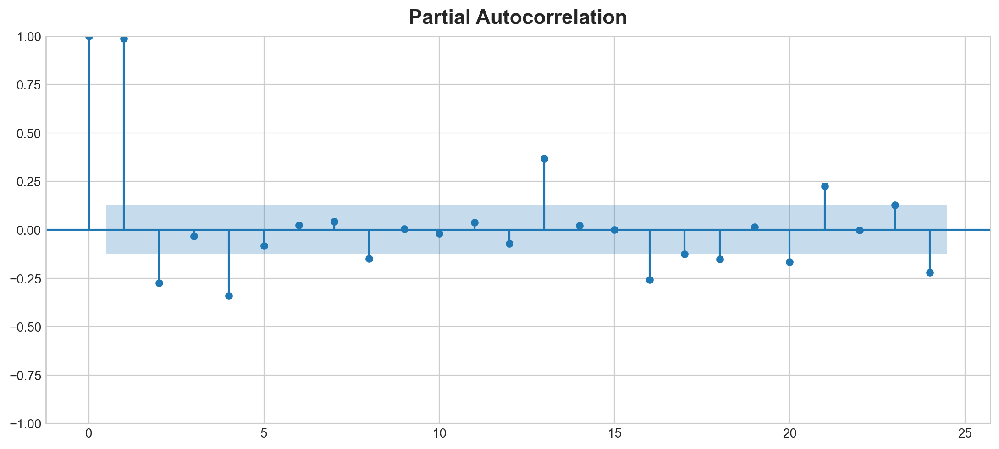

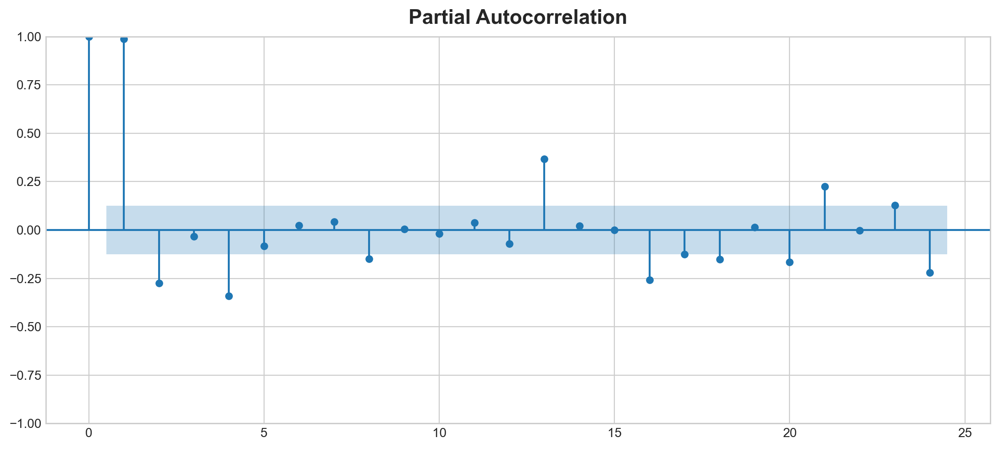

In [54]:
plot_pacf(train['inflation'])


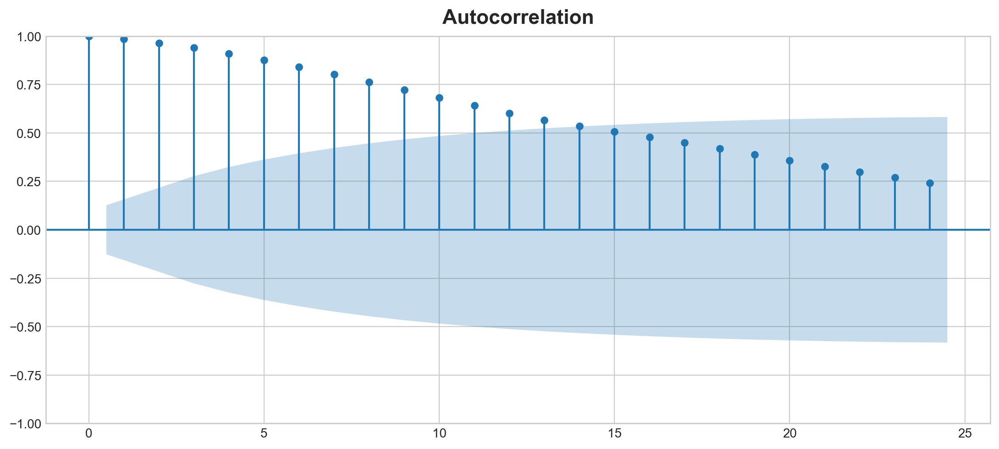

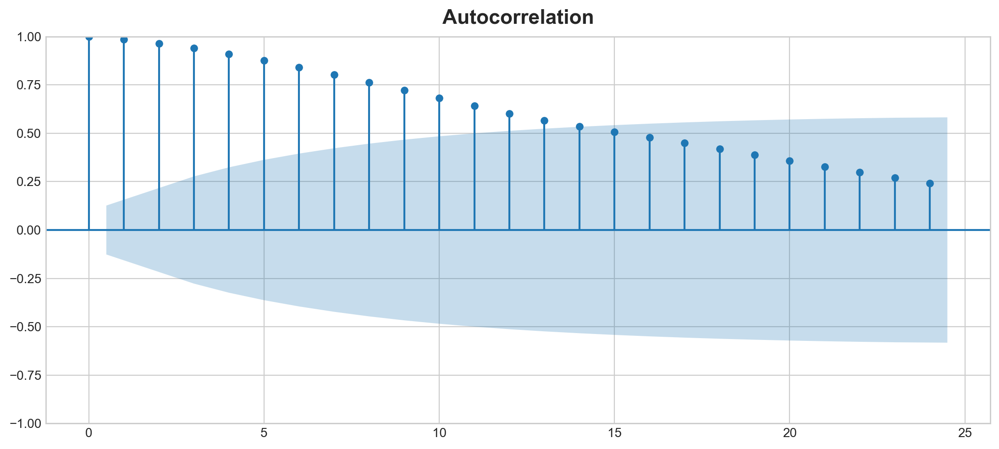

In [55]:
plot_acf(train['inflation'].dropna())


In [189]:
concatenated_df

,DATE,inflation,unemployment,interest,exports,imports,moneysupply,ppi,year,month
0,1990-01-01,5.9,6.8,10.8900,1.404238e+10,1.804408e+10,1.681660e+11,5.386733,1990,1
1,1990-02-01,6.3,6.8,11.3300,1.429611e+10,1.767467e+10,1.693210e+11,5.371894,1990,2
2,1990-03-01,6.2,6.7,12.4200,1.372672e+10,1.780426e+10,1.707170e+11,5.479455,1990,3
3,1990-04-01,7.7,6.8,12.7400,1.417412e+10,1.806603e+10,1.715400e+11,6.267027,1990,4
4,1990-05-01,8.2,6.7,12.4100,1.475232e+10,1.798045e+10,1.720790e+11,6.089312,1990,5
...,...,...,...,...,...,...,...,...,...,...
247,2010-08-01,2.4,7.8,3.2330,3.435595e+10,4.692579e+10,1.098187e+12,4.217536,2010,8
248,2010-09-01,2.4,7.9,3.1271,3.449105e+10,4.620309e+10,1.082137e+12,4.208195,2010,9
249,2010-10-01,2.5,7.9,3.0685,3.543559e+10,4.820202e+10,1.094549e+12,4.520397,2010,10
250,2010-11-01,2.6,7.9,3.3110,3.625446e+10,4.948086e+10,1.077534e+12,4.490690,2010,11


In [190]:
train = concatenated_df['1990-01':'2009-12']
test = concatenated_df['2010-01':]
train_diff = train.diff().dropna()

TypeError: cannot do slice indexing on RangeIndex with these indexers [1990-01] of type str

In [ ]:
train = concatenated_df['1990-01':'2009-12']
test = concatenated_df['2010-01':]
train_diff = train.diff().dropna()

# Fitting ARIMA(1,1,1) model on inflation data
inflation_train = train.iloc[:, 0]
inflation_test = test.iloc[:, 0]

model_arima = ARIMA(inflation_train, order=(1,1,1))
results_arima = model_arima.fit()

# Predicting on test data
forecast_arima = results_arima.forecast(steps=len(inflation_test))

# Calculating metrics
mse_arima = mean_squared_error(inflation_test, forecast_arima[:len(inflation_test)])
rmse_arima = np.sqrt(mse_arima)
mape_arima = np.mean(np.abs((inflation_test.values - forecast_arima[:len(inflation_test)]) / inflation_test.values)) * 100
mean_model_error_arima = np.mean(inflation_test.values - forecast_arima[:len(inflation_test)])
rsquared_arima = 1 - (np.var(inflation_test.values - forecast_arima[:len(inflation_test)]) / np.var(inflation_test))

metrics_arima = {
    "MSE": mse_arima,
    "RMSE": rmse_arima,
    "Mean Model Error": mean_model_error_arima,
    "R^2": rsquared_arima,
    "MAPE (%)": mape_arima
}

metrics_arima


# Auto Arima

In [56]:
import pandas as pd
from pmdarima import auto_arima
model = auto_arima(train['inflation'], 
                   seasonal=True,   # If you believe there's seasonality in your data
                   m=12,           # Frequency of your data (e.g., 12 for monthly data)
                   trace=True,     # If you want to see output logs
                   stepwise=True)  # Stepwise search or not

# Print the summary of the model
print(model.summary())

Performing stepwise search to minimize aic
 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=-6.004, Time=3.48 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=41.046, Time=0.22 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=15.108, Time=0.73 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=2.490, Time=1.29 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=39.928, Time=0.05 sec
 ARIMA(2,1,2)(0,0,1)[12] intercept   : AIC=-4.523, Time=2.19 sec
 ARIMA(2,1,2)(1,0,0)[12] intercept   : AIC=13.993, Time=2.52 sec
 ARIMA(2,1,2)(2,0,1)[12] intercept   : AIC=-4.682, Time=28.42 sec


KeyboardInterrupt: 

Since acf and pacf is cutting off at lag1 and auto arima also suggested the orsers(1,1,1) so we can go with arima(1,1,1) model

In [184]:
arima_model = ARIMA(np.log(train['inflation']), order = (1,1,1))

arima_fit = arima_model.fit()
arima_fit.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                               SARIMAX Results                                
==============================================================================
Dep. Variable:              inflation   No. Observations:                  240
Model:                 ARIMA(1, 1, 1)   Log Likelihood                 199.543
Date:                Thu, 07 Sep 2023   AIC                           -393.086
Time:                        16:27:34   BIC                           -382.657
Sample:                    01-01-1990   HQIC                          -388.884
                         - 12-01-2009                                         
Covariance Type:                  opg                                         
==============================================================================
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1         -0.1466      0.318     -0.462      0.644      -0.769       0.476
ma.L1          0.2919      0.310      0.941      0.347      -0.316       0.900
sigma2         0.0110      0.001     12.417      0.000       0.009       0.013
===================================================================================
Ljung-Box (L1) (Q):                   0.01   Jarque-Bera (JB):                 4.03
Prob(Q):                              0.94   Prob(JB):                         0.13
Heteroskedasticity (H):               2.20   Skew:                             0.04
Prob(H) (two-sided):                  0.00   Kurtosis:                         3.63
===================================================================================

Warnings:
[1] Covariance matrix calculated using the outer product of gradients (complex-step).
"""

In [185]:
forecast = arima_fit.get_forecast(steps=len(test))
mean_forecast = forecast.predicted_mean
conf_int = forecast.conf_int()

In [188]:
forecast

<Figure size 1200x600 with 0 Axes>

Text(0.5, 1.0, 'ARIMA Forecast with Confidence Intervals')

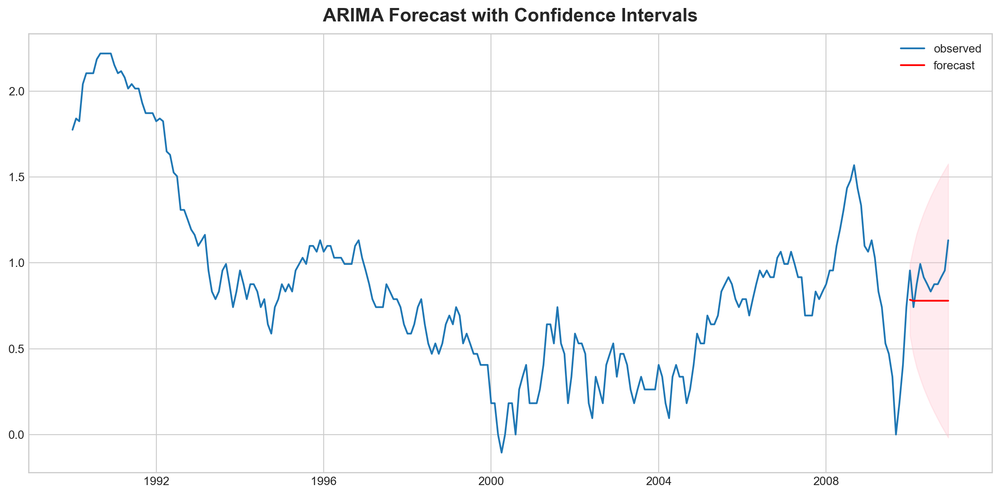

In [186]:
# Plot the original data
plt.figure(figsize=(12, 6))
plt.plot(dfn.index, np.log(dfn['inflation']), label='observed')

# Plot the forecasted data
plt.plot(mean_forecast.index, mean_forecast.values, color='red', label='forecast')

# Shade the area between the confidence intervals
plt.fill_between(conf_int.index, 
                 conf_int.iloc[:, 0], 
                 conf_int.iloc[:, 1], color='pink', alpha=0.3)

plt.title('ARIMA Forecast with Confidence Intervals')
plt.legend()
plt.show()


###Forcasting using ARIMA model for the test dataset

DATE
1990-01-01    5.9
1990-02-01    6.3
1990-03-01    6.2
1990-04-01    7.7
1990-05-01    8.2
             ... 
2009-08-01    1.4
2009-09-01    1.0
2009-10-01    1.2
2009-11-01    1.5
2009-12-01    2.1
Name: inflation, Length: 240, dtype: float64

The forecasted UK  Consumer Price Index is  -16.16


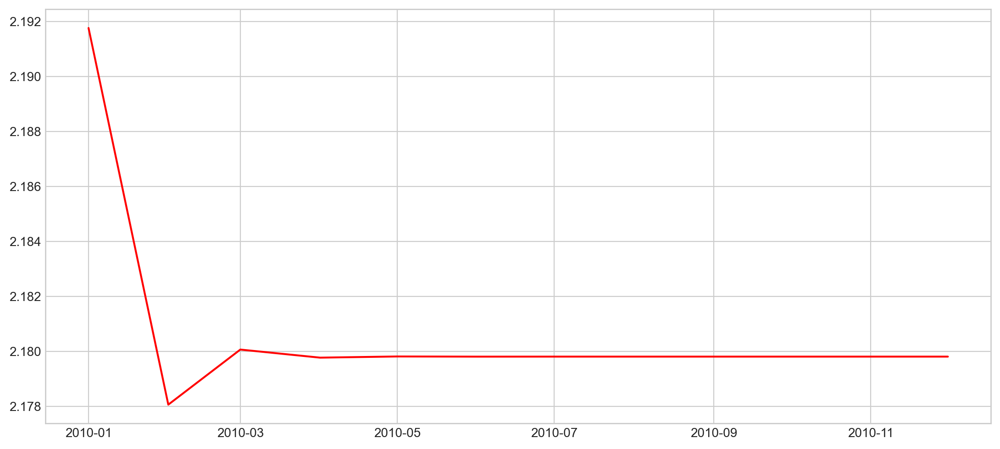

In [60]:
forecast = arima_fit.forecast(steps=12)
forecast = np.exp(forecast)
train['inflation']

plt.plot(forecast, color = 'red')

pct_chg = ((forecast[-1] - dfn.iloc[-12]['inflation'])/dfn.iloc[-12]['inflation']) * 100
print('The forecasted UK  Consumer Price Index is ' , round(pct_chg,2))

<Figure size 1200x600 with 0 Axes>

Text(0.5, 0, 'Date')

Text(0, 0.5, 'Inflation')

Text(0.5, 1.0, 'Actual vs. Forecasted UK Consumer Price Index')

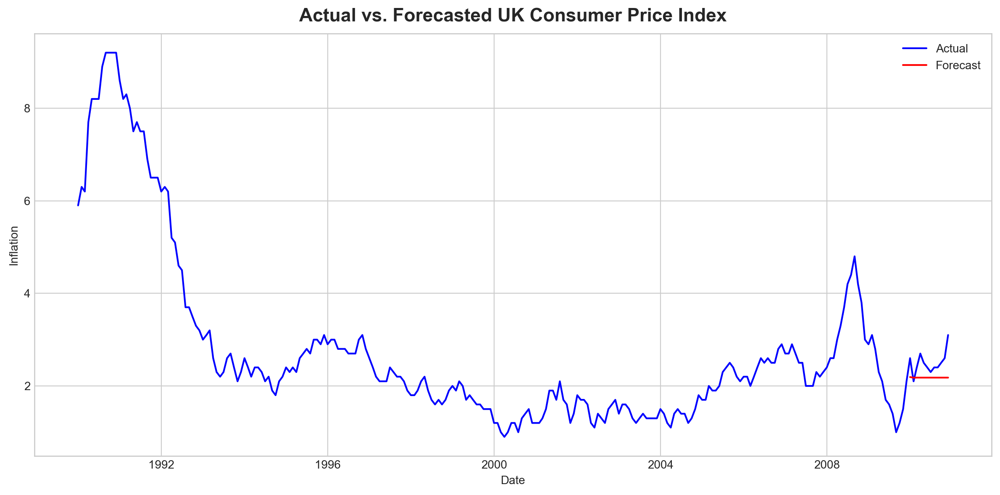

In [61]:
plt.figure(figsize=(12, 6))
plt.plot(dfn.index, dfn['inflation'], label='Actual', color='blue')
plt.plot(forecast.index, forecast, label='Forecast', color='red')
plt.xlabel('Date')
plt.ylabel('Inflation')
plt.title('Actual vs. Forecasted UK Consumer Price Index')
plt.legend()
plt.show()

In [62]:
forecast

2010-01-01    2.191768
2010-02-01    2.178069
2010-03-01    2.180072
2010-04-01    2.179778
2010-05-01    2.179821
2010-06-01    2.179815
2010-07-01    2.179816
2010-08-01    2.179815
2010-09-01    2.179815
2010-10-01    2.179815
2010-11-01    2.179815
2010-12-01    2.179815
Freq: MS, Name: predicted_mean, dtype: float64

### Evaluation of ARIMA model

In [187]:
#Mean Squared Error
mse = mean_squared_error(test['inflation'].values, forecast[:12])
print('MSE: ', mse)

#Mean Model Error
model_error = test['inflation'] - forecast
print('Mean Model Error: ', model_error.mean())

#Root Mean Square Error
rms = sqrt(mean_squared_error(test['inflation'],forecast[:12]))
print('RMSE:',rms)


#R square value
actual_values = test['inflation'].values  # Actual inflation values
predicted_values = forecast[:12]         # Forecasted values

mean_actual = np.mean(actual_values)
ssr = np.sum((predicted_values - actual_values) ** 2)
sst = np.sum((actual_values - mean_actual) ** 2)

r_squared = 1 - (ssr / sst)
print('R-squared:', r_squared)


# Mean Absolute Percentage Error
absolute_percentage_errors = np.abs((actual_values - predicted_values) / actual_values)
mape = np.mean(absolute_percentage_errors) * 100
print('MAPE:', mape)

TypeError: 'PredictionResultsWrapper' object is not subscriptable

So we can conclude that the ARIMA model performed badly as there is a small difference between the actual and forecasted value.

Now We can improve the model by including other features and using multivariate forecasting.

## Lagged values as inputs

In [64]:
def make_lags(ts, lags):
    return pd.concat({f'y_lag_{i}': ts.shift(i) for i in range(1, lags + 1)},axis=1)

In [65]:
X = make_lags(dfn.inflation, lags=13)
X = X.fillna(0.0)
X.head()

,y_lag_1,y_lag_2,y_lag_3,y_lag_4,y_lag_5,y_lag_6,y_lag_7,y_lag_8,y_lag_9,y_lag_10,y_lag_11,y_lag_12,y_lag_13
DATE,,,,,,,,,,,,,
1990-01-01,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1990-02-01,5.9,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1990-03-01,6.3,5.9,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1990-04-01,6.2,6.3,5.9,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1990-05-01,7.7,6.2,6.3,5.9,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [66]:
# Combine to create the training data
X = pd.concat([dfn, X], axis=1).fillna(0.0)
X.head()

,inflation,unemployment,interest,exports,imports,moneysupply,ppi,year,month,y_lag_1,...,y_lag_4,y_lag_5,y_lag_6,y_lag_7,y_lag_8,y_lag_9,y_lag_10,y_lag_11,y_lag_12,y_lag_13
DATE,,,,,,,,,,,,,,,,,,,,,
1990-01-01,5.9,6.8,10.89,1.404238e+10,1.804408e+10,1.681660e+11,5.386733,1990,1,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1990-02-01,6.3,6.8,11.33,1.429611e+10,1.767467e+10,1.693210e+11,5.371894,1990,2,5.9,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1990-03-01,6.2,6.7,12.42,1.372672e+10,1.780426e+10,1.707170e+11,5.479455,1990,3,6.3,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1990-04-01,7.7,6.8,12.74,1.417412e+10,1.806603e+10,1.715400e+11,6.267027,1990,4,6.2,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1990-05-01,8.2,6.7,12.41,1.475232e+10,1.798045e+10,1.720790e+11,6.089312,1990,5,7.7,...,5.9,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [67]:
X.columns
csv_data = X.to_csv(index=False)
from IPython.core.display import display, HTML

# Convert the CSV string to a byte stream
import base64
csv_bytes = csv_data.encode('utf-8')
b64 = base64.b64encode(csv_bytes).decode()

# Create the HTML link
link = f'<a download="dataframe.csv" href="data:text/csv;base64,{b64}" target="_blank">Download CSV</a>'
display(HTML(link))


Index(['inflation', 'unemployment', 'interest', 'exports', 'imports',
       'moneysupply', 'ppi', 'year', 'month', 'y_lag_1', 'y_lag_2', 'y_lag_3',
       'y_lag_4', 'y_lag_5', 'y_lag_6', 'y_lag_7', 'y_lag_8', 'y_lag_9',
       'y_lag_10', 'y_lag_11', 'y_lag_12', 'y_lag_13'],
      dtype='object')

Training dataset: 240, Test dataset: 12


<Axes: xlabel='DATE'>

<Axes: xlabel='DATE'>

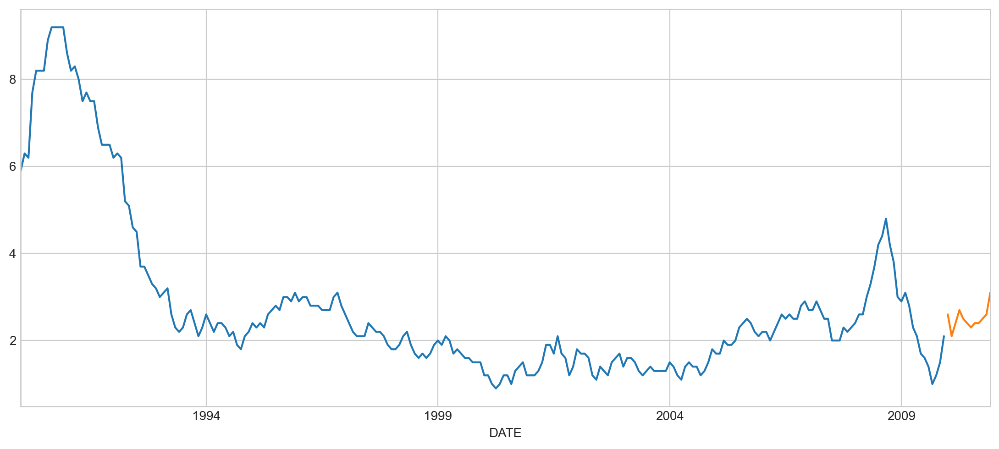

In [68]:
#splitting the data into  train and test for the models

split_point = len(X) - 12
train, test = X[0:split_point], X[split_point:]
print('Training dataset: %d, Test dataset: %d' % (len(train), len(test)))
train['inflation'].plot()
test['inflation'].plot()

# Dynamic Regression on Data Poor Environment

In [180]:
# Assuming your CSV file has columns 'Date', 'Inflation', 'Unemployment', 'MoneySupply', and 'InterestRate'
target_train = train['inflation']
regressors_train = train[['unemployment', 'interest', 'ppi']]
target_test = test['inflation']
regressors_test= test[['unemployment', 'interest', 'ppi']]

In [181]:
# Assuming you have chosen appropriate values for p, d, q
p, d, q = (1, 1, 1)  # Replace these with the appropriate ARIMA order

# Set the seasonal order to (0, 0, 0, 0) to ignore seasonality
P, D, Q, S = (0, 0, 0, 0)

# Create and fit the SARIMAX model without seasonality
model = sm.tsa.statespace.SARIMAX(target_train, order=(p, d, q), seasonal_order=(P, D, Q, S), exog=regressors_train)
results = model.fit()

# Print the summary of the model
print(results.summary())

                               SARIMAX Results                                
Dep. Variable:              inflation   No. Observations:                  240
Model:               SARIMAX(1, 1, 1)   Log Likelihood                  14.948
Date:                Mon, 04 Sep 2023   AIC                            -17.896
Time:                        22:04:56   BIC                              2.963
Sample:                    01-01-1990   HQIC                            -9.491
                         - 12-01-2009                                         
Covariance Type:                  opg                                         
                   coef    std err          z      P>|z|      [0.025      0.975]
--------------------------------------------------------------------------------
unemployment    -0.0933      0.110     -0.846      0.398      -0.310       0.123
interest        -0.0119      0.068     -0.174      0.862      -0.146       0.122
ppi              0.1725      0.026      6.57

In [ ]:
# Forecast inflation for the testing period
predictions = results.get_prediction(start=target_test.index[0], end=target_test.index[-1], exog=regressors_test)

# Get predicted values and confidence intervals
predicted_values = predictions.predicted_mean
confidence_intervals = predictions.conf_int()

# Print the predicted values and confidence intervals
print(predicted_values)
print(confidence_intervals)


In [ ]:
# Plot actual data
plt.figure(figsize=(10, 6))
plt.plot(dfn.index, dfn['inflation'], label='Actual', color='blue')

# Plot predicted values
plt.plot(target_test.index, predicted_values, label='Predicted', color='red')

# Plot confidence intervals
plt.fill_between(target_test.index, confidence_intervals['lower inflation'], confidence_intervals['upper inflation'], color='pink', alpha=0.3)

plt.xlabel('Date')
plt.ylabel('CPI')
plt.title('Dynamic Regression on Data Poor Environment')
plt.legend()
plt.grid(True)
plt.show()


#### Evaluation of dynamic regression model on data poor environment

In [ ]:


mse = mean_squared_error(test['inflation'], predicted_values)
print('MSE: ', mse)
model_error = test['inflation'] - predicted_values
print('Mean Model Error: ', model_error.mean())

rms = sqrt(mean_squared_error(test['inflation'],predicted_values))
print('RMSE',rms)


#R square value
actual_values = test['inflation'].values  # Actual inflation values
predicted_values = predicted_values[:12]         # Forecasted values

mean_actual = np.mean(actual_values)
ssr = np.sum((predicted_values - actual_values) ** 2)
sst = np.sum((actual_values - mean_actual) ** 2)

r_squared = 1 - (ssr / sst)
print('R-squared:', r_squared)


# Mean Absolute Percentage Error
absolute_percentage_errors = np.abs((actual_values - predicted_values) / actual_values)
mape = np.mean(absolute_percentage_errors) * 100
print('MAPE:', mape)

## Dynamic Regression on data rich environment

In [182]:
# we are using all the variables available to predict the cpi no matter what their correlations are
target_train_rich = train['inflation']
regressors_train_rich = train[['unemployment', 'interest','moneysupply', 'imports' ,'exports','ppi']]
target_test_rich = test['inflation']
regressors_test_rich= test[['unemployment', 'interest','moneysupply', 'imports' ,'exports','ppi']]

In [183]:
# Assuming you have chosen appropriate values for p, d, q
p, d, q = (1, 1, 1)  # Replace these with the appropriate ARIMA order

# Set the seasonal order to (0, 0, 0, 0) to ignore seasonality
P, D, Q, S = (0, 0, 0, 0)

# Create and fit the SARIMAX model without seasonality
model_rich = sm.tsa.statespace.SARIMAX(target_train_rich, order=(p, d, q), seasonal_order=(P, D, Q, S), exog=regressors_train_rich)
results_rich = model_rich.fit()

# Print the summary of the model
print(results_rich.summary())

                               SARIMAX Results                                
Dep. Variable:              inflation   No. Observations:                  240
Model:               SARIMAX(1, 1, 1)   Log Likelihood                  14.308
Date:                Mon, 04 Sep 2023   AIC                            -10.615
Time:                        22:05:07   BIC                             20.673
Sample:                    01-01-1990   HQIC                             1.993
                         - 12-01-2009                                         
Covariance Type:                  opg                                         
                   coef    std err          z      P>|z|      [0.025      0.975]
--------------------------------------------------------------------------------
unemployment    -0.1569   2.24e-22  -7.01e+20      0.000      -0.157      -0.157
interest         0.0314   1.72e-21   1.83e+19      0.000       0.031       0.031
moneysupply  -1.916e-12   1.78e-12     -1.07

In [ ]:
# Forecast inflation for the testing period
predictions_rich = results_rich.get_prediction(start=target_test_rich.index[0], end=target_test_rich.index[-1], exog=regressors_test_rich)

# Get predicted values and confidence intervals
predicted_values_rich = predictions_rich.predicted_mean
confidence_intervals_rich = predictions_rich.conf_int()

# Print the predicted values and confidence intervals
print(predicted_values_rich)
print(confidence_intervals_rich)


In [ ]:
# Plot actual data
plt.figure(figsize=(10, 6))
plt.plot(dfn.index, dfn['inflation'], label='Actual', color='blue')

# Plot predicted values
plt.plot(target_test_rich.index, predicted_values_rich, label='Predicted', color='red')

# Plot confidence intervals
plt.fill_between(target_test_rich.index, confidence_intervals_rich['lower inflation'], confidence_intervals_rich['upper inflation'], color='pink', alpha=0.3)

plt.xlabel('Date')
plt.ylabel('CPI')
plt.title('Dynamic Regression on Data Rich Environment')
plt.legend()
plt.grid(True)
plt.show()


#### Evaluation of dynamic regression model on data rich environment


In [ ]:

mse = mean_squared_error(test['inflation'], predicted_values_rich)
print('MSE: ', mse)
model_error = test['inflation'] - predicted_values_rich
print('Mean Model Error: ', model_error.mean())
rms = sqrt(mean_squared_error(test['inflation'],predicted_values_rich))
print('RMSE',rms)

#R square value
actual_values = test['inflation'].values  # Actual inflation values
predicted_values = predicted_values_rich[:12]         # Forecasted values

mean_actual = np.mean(actual_values)
ssr = np.sum((predicted_values - actual_values) ** 2)
sst = np.sum((actual_values - mean_actual) ** 2)

r_squared = 1 - (ssr / sst)
print('R-squared:', r_squared)


# Mean Absolute Percentage Error
absolute_percentage_errors = np.abs((actual_values - predicted_values) / actual_values)
mape = np.mean(absolute_percentage_errors) * 100
print('MAPE:', mape)

# Random Forest on data rich

In [111]:
X_train = train[['unemployment','interest','exports','imports','moneysupply','ppi', 'y_lag_1', 'y_lag_2', 'y_lag_3',
       'y_lag_4', 'y_lag_5', 'y_lag_6', 'y_lag_7', 'y_lag_8', 'y_lag_9',
       'y_lag_10', 'y_lag_11', 'y_lag_12', 'y_lag_13']]
y_train = train['inflation']
X_test=test[['unemployment','interest','exports','imports','moneysupply','ppi','y_lag_1', 'y_lag_2', 'y_lag_3',
       'y_lag_4', 'y_lag_5', 'y_lag_6', 'y_lag_7', 'y_lag_8', 'y_lag_9',
       'y_lag_10', 'y_lag_11', 'y_lag_12', 'y_lag_13']]
y_test=test['inflation']

In [ ]:
from sklearn.ensemble import RandomForestRegressor


In [203]:
print(X_train.shape)
print(y_train.shape)


(240, 19)
(240,)


In [71]:
#hyperparameter tuning
from sklearn.ensemble import RandomForestRegressor
from sklearn.model_selection import GridSearchCV

# Define the parameter grid
param_grid = {
    'n_estimators': [100, 300, 500, 800, 1200],
    'max_depth': [5, 8, 15, 25, 30],
    'min_samples_split': [2, 5, 10, 15, 100],
    'min_samples_leaf': [1, 2, 5, 10],
    'max_features': ['auto', 'sqrt', 'log2']
}

# Create a Random Forest regressor
reg_rf = RandomForestRegressor()

# Grid search with cross-validation
grid_search = GridSearchCV(estimator=reg_rf, param_grid=param_grid, cv=3, n_jobs=-1, verbose=2)
grid_search.fit(X_train, y_train)

# Get the best parameters from the grid search
best_params = grid_search.best_params_

print(best_params)

Fitting 3 folds for each of 1500 candidates, totalling 4500 fits


GridSearchCV(cv=3, estimator=RandomForestRegressor(), n_jobs=-1,
             param_grid={'max_depth': [5, 8, 15, 25, 30],
                         'max_features': ['auto', 'sqrt', 'log2'],
                         'min_samples_leaf': [1, 2, 5, 10],
                         'min_samples_split': [2, 5, 10, 15, 100],
                         'n_estimators': [100, 300, 500, 800, 1200]},
             verbose=2)

{'max_depth': 15, 'max_features': 'auto', 'min_samples_leaf': 1, 'min_samples_split': 5, 'n_estimators': 100}


In [112]:
best_params={'max_depth': 15, 'max_features': 'auto', 'min_samples_leaf': 1, 'min_samples_split': 5, 'n_estimators': 100}

In [113]:
# Adjust the provided code with the suggested hyperparameters
reg_rf = RandomForestRegressor(**best_params)
reg_rf.fit(X_train, y_train)
yhat_rf = reg_rf.predict(X_test)


# Return a sample of the predictions
yhat_rf[:10]

RandomForestRegressor(max_depth=15, max_features='auto', min_samples_split=5)

array([1.99690516, 2.49421429, 2.11645159, 2.41279087, 2.81163968,
       2.53355317, 2.48389484, 2.44168571, 2.50963214, 2.43833056])

In [114]:

# Recompute the metrics with the necessary libraries loaded

# 1. Mean Squared Error (MSE)
mse_rf = mean_squared_error(y_test, yhat_rf)

# 2. Mean Model Error
model_error_rf = y_test - yhat_rf
mean_model_error_rf = model_error_rf.mean()

# 3. Root Mean Squared Error (RMSE)
rms_rf = sqrt(mean_squared_error(y_test, yhat_rf))

# 4. R^2 (R-squared)
mean_actual_rf = np.mean(y_test)
ssr_rf = np.sum((yhat_rf - y_test) ** 2)
sst_rf = np.sum((y_test - mean_actual_rf) ** 2)
r_squared_rf = 1 - (ssr_rf / sst_rf)

# 5. Mean Absolute Percentage Error (MAPE)
absolute_percentage_errors_rf = np.abs((y_test - yhat_rf) / y_test)
mape_rf = np.mean(absolute_percentage_errors_rf) * 100

print('MSE: ', mse_rf)
print('Mean Model Error: ', mean_model_error_rf)
print('RMSE',rms_rf)
      
print('R-squared:', r_squared_rf)
print('MAPE:', mape_rf)


MSE:  0.0865664172617867
Mean Model Error:  0.04612053571428648
RMSE 0.29422171446340717
R-squared: -0.573934859305212
MAPE: 9.623348341273903


In [115]:
#feature importance

# After training your Random Forest model:
feature_importances = reg_rf.feature_importances_

# Pairing feature names with their importance scores
features_list = list(X_train.columns)
feature_importance_pairs = list(zip(features_list, feature_importances))

# Sorting the features based on importance
sorted_features = sorted(feature_importance_pairs, key=lambda x: x[1], reverse=True)

# Displaying the features and their importance
for feature, importance in sorted_features:
    print(f"{feature}: {importance:.4f}")


y_lag_1: 0.4688
interest: 0.2639
moneysupply: 0.1726
y_lag_2: 0.0521
ppi: 0.0290
exports: 0.0026
imports: 0.0024
unemployment: 0.0014
y_lag_13: 0.0012
y_lag_4: 0.0008
y_lag_12: 0.0008
y_lag_8: 0.0008
y_lag_10: 0.0007
y_lag_7: 0.0005
y_lag_3: 0.0005
y_lag_11: 0.0005
y_lag_9: 0.0005
y_lag_6: 0.0005
y_lag_5: 0.0004


In [116]:
X_train = train[['unemployment','interest','exports','imports','moneysupply','ppi', 'y_lag_1', 'y_lag_2']]
y_train = train['inflation']
X_test=test[['unemployment','interest','exports','imports','moneysupply','ppi','y_lag_1', 'y_lag_2']]
y_test=test['inflation']

In [248]:
print(best_params)

{'max_depth': 30, 'max_features': 'auto', 'min_samples_leaf': 2, 'min_samples_split': 10, 'n_estimators': 100}


In [119]:
# Adjust the provided code with the suggested hyperparameters
reg_rf = RandomForestRegressor(**best_params)
reg_rf.fit(X_train, y_train)
yhat_rf = reg_rf.predict(X_test)

# Return a sample of the predictions
yhat_rf[:10]

RandomForestRegressor(max_depth=15, max_features='auto', min_samples_split=5)

array([2.01964802, 2.51567341, 2.17248175, 2.45699341, 2.73602024,
       2.53227619, 2.46861508, 2.45650015, 2.49517674, 2.49124103])

In [120]:

# Recompute the metrics with the necessary libraries loaded

# 1. Mean Squared Error (MSE)
mse_rf = mean_squared_error(y_test, yhat_rf)

# 2. Mean Model Error
model_error_rf = y_test - yhat_rf
mean_model_error_rf = model_error_rf.mean()

# 3. Root Mean Squared Error (RMSE)
rms_rf = sqrt(mean_squared_error(y_test, yhat_rf))

# 4. R^2 (R-squared)
mean_actual_rf = np.mean(y_test)
ssr_rf = np.sum((yhat_rf - y_test) ** 2)
sst_rf = np.sum((y_test - mean_actual_rf) ** 2)
r_squared_rf = 1 - (ssr_rf / sst_rf)

# 5. Mean Absolute Percentage Error (MAPE)
absolute_percentage_errors_rf = np.abs((y_test - yhat_rf) / y_test)
mape_rf = np.mean(absolute_percentage_errors_rf) * 100

print('MSE: ', mse_rf)
print('Mean Model Error: ', mean_model_error_rf)
print('RMSE',rms_rf)
      
print('R-squared:', r_squared_rf)
print('MAPE:', mape_rf)


MSE:  0.07657163059982164
Mean Model Error:  0.035231384818884694
RMSE 0.2767157939110481
R-squared: -0.39221146545130203
MAPE: 8.739410617087286


<Figure size 1500x700 with 0 Axes>

Text(0.5, 1.0, 'Comparison of True Values and Predictions')

Text(0.5, 0, 'Index')

Text(0, 0.5, 'Value')

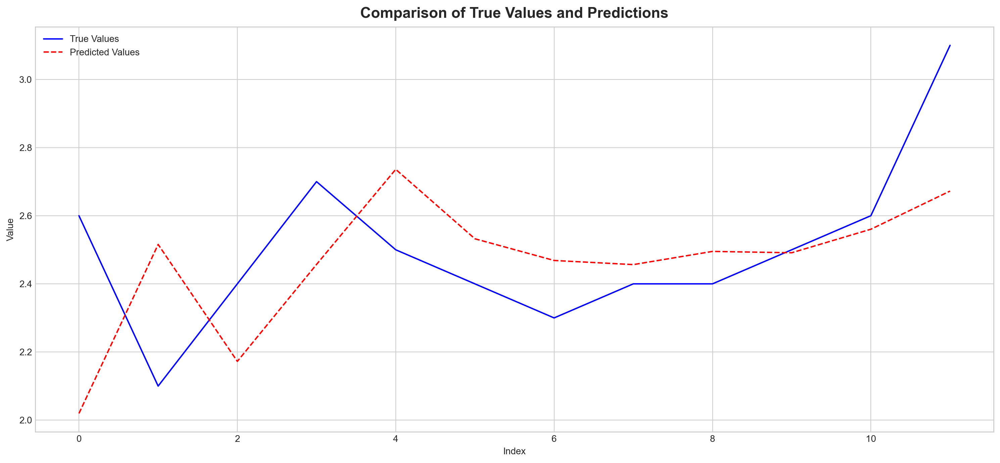

In [121]:
import matplotlib.pyplot as plt

# Assuming df_test.pollution_today holds the true values for the test set
true_values = test['inflation']

# Create a range for x-axis
x_range = range(len(true_values))

plt.figure(figsize=(15, 7))

# Plot true values
plt.plot(x_range, true_values, label='True Values', color='blue')

# Plot predicted values
plt.plot(x_range, yhat_rf, label='Predicted Values', color='red', linestyle='--')

plt.title('Comparison of True Values and Predictions')
plt.legend()
plt.xlabel('Index')
plt.ylabel('Value')
plt.tight_layout()
plt.show()


<Figure size 1000x600 with 0 Axes>

Text(0.5, 1.0, 'Random Forest Model on Data Rich Environment with 95% Confidence Interval')

Text(0.5, 0, 'Date')

Text(0, 0.5, 'CPI')

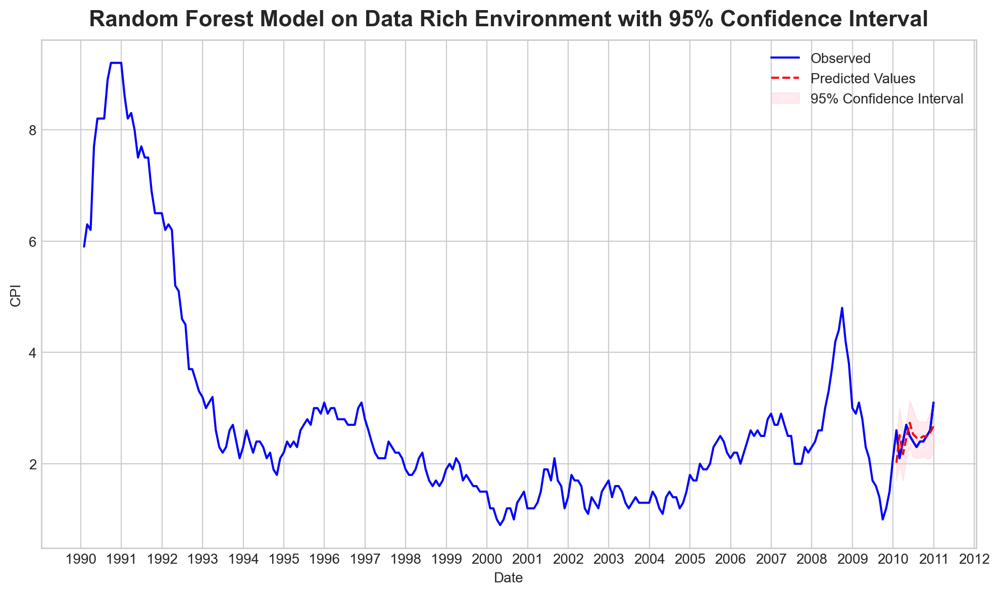

In [122]:
import matplotlib.dates as mdates
# Get predictions from all trees
all_tree_predictions = [tree.predict(X_test) for tree in reg_rf.estimators_]

# Transpose to have each instance's predictions in one array
all_tree_predictions = np.transpose(all_tree_predictions)

# Calculate the percentiles for each instance
lower_bound = np.percentile(all_tree_predictions, 2.5, axis=1)
upper_bound = np.percentile(all_tree_predictions, 97.5, axis=1)
# Creating a date range for the entire dataset from Jan 1990 to Dec 2010
date_range = pd.date_range(start="1990-01-01", end="2010-12-31", freq='M')

# Assuming df has a 'pollution_today' column with the entire dataset's true values
true_values_all = X.inflation.values

# Getting only the true values for the test set (last 12 months of the entire dataset)
true_values_test = test.inflation.values

test_dates = date_range[-12:]
plt.figure(figsize=(10, 6))



# Plotting the entire dataset's true values
plt.plot(date_range, true_values_all, label='Observed', color='blue')

# Highlighting the test set's true values
plt.plot(test_dates, true_values_test, color='blue')
#, label='Test Set True Values'
# Plotting the predictions for the test set
plt.plot(test_dates, yhat_rf, label='Predicted Values', color='red', linestyle='--')

# Plotting the confidence intervals
plt.fill_between(test_dates, lower_bound, upper_bound, color='pink', alpha=0.3,label='95% Confidence Interval')
#, label='95% Confidence Interval'

# Formatting the x-axis to show years
plt.gca().xaxis.set_major_formatter(mdates.DateFormatter('%Y'))
plt.gca().xaxis.set_major_locator(mdates.YearLocator())

plt.title('Random Forest Model on Data Rich Environment with 95% Confidence Interval')
plt.legend()
plt.xlabel('Date')
plt.ylabel('CPI')
plt.tight_layout()
plt.grid(True)
plt.show()


### RF on data poor Environment

In [123]:
X_train = train[['unemployment','interest','ppi', 'y_lag_1', 'y_lag_2', 'y_lag_3',
       'y_lag_4', 'y_lag_5', 'y_lag_6', 'y_lag_7', 'y_lag_8', 'y_lag_9',
       'y_lag_10', 'y_lag_11', 'y_lag_12', 'y_lag_13']]
y_train = train['inflation']
X_test=test[['unemployment','interest','ppi', 'y_lag_1', 'y_lag_2', 'y_lag_3',
       'y_lag_4', 'y_lag_5', 'y_lag_6', 'y_lag_7', 'y_lag_8', 'y_lag_9',
       'y_lag_10', 'y_lag_11', 'y_lag_12', 'y_lag_13']]
y_test=test['inflation']

In [270]:
#hyperparameter tuning
from sklearn.ensemble import RandomForestRegressor
from sklearn.model_selection import GridSearchCV

# Define the parameter grid
param_grid = {
    'n_estimators': [100, 300, 500, 800, 1200],
    'max_depth': [5, 8, 15, 25, 30],
    'min_samples_split': [2, 5, 10, 15, 100],
    'min_samples_leaf': [1, 2, 5, 10],
    'max_features': ['auto', 'sqrt', 'log2']
}

# Create a Random Forest regressor
reg_rf = RandomForestRegressor()

# Grid search with cross-validation
grid_search = GridSearchCV(estimator=reg_rf, param_grid=param_grid, cv=3, n_jobs=-1, verbose=2)
grid_search.fit(X_train, y_train)

# Get the best parameters from the grid search
best_params = grid_search.best_params_

print(best_params)

Fitting 3 folds for each of 1500 candidates, totalling 4500 fits


KeyboardInterrupt: 

In [124]:
best_params={'max_depth': 30, 'max_features': 'auto', 'min_samples_leaf': 1, 'min_samples_split': 5, 'n_estimators': 100}

In [130]:
#model fitting

# Train the Random Forest with the best hyperparameters
reg_rf_best = RandomForestRegressor(**best_params)
reg_rf_best.fit(X_train, y_train)
yhat_rf_best = reg_rf_best.predict(X_test)

# Sample predictions
yhat_rf_best[:10]

RandomForestRegressor(max_depth=30, max_features='auto', min_samples_split=5)

array([1.9637877 , 2.51610653, 2.08669116, 2.3830881 , 2.86140079,
       2.55181071, 2.46459206, 2.44961944, 2.47911825, 2.42266865])

In [128]:

# Recompute the metrics with the necessary libraries loaded

# 1. Mean Squared Error (MSE)
mse_rf = mean_squared_error(y_test, yhat_rf_best)

# 2. Mean Model Error
model_error_rf = y_test - yhat_rf_best
mean_model_error_rf = model_error_rf.mean()


print('MSE: ', mse_rf)
print('Mean Model Error: ', mean_model_error_rf)


MSE:  0.08926957063276526
Mean Model Error:  0.057986198292448665


In [131]:
#feature importance

# After training your Random Forest model:
feature_importances = reg_rf_best.feature_importances_

# Pairing feature names with their importance scores
features_list = list(X_train.columns)
feature_importance_pairs = list(zip(features_list, feature_importances))

# Sorting the features based on importance
sorted_features = sorted(feature_importance_pairs, key=lambda x: x[1], reverse=True)

# Displaying the features and their importance
for feature, importance in sorted_features:
    print(f"{feature}: {importance:.4f}")


y_lag_1: 0.4768
interest: 0.4534
ppi: 0.0367
y_lag_2: 0.0218
unemployment: 0.0025
y_lag_12: 0.0011
y_lag_13: 0.0011
y_lag_8: 0.0011
y_lag_7: 0.0010
y_lag_3: 0.0010
y_lag_6: 0.0008
y_lag_11: 0.0007
y_lag_4: 0.0007
y_lag_9: 0.0006
y_lag_5: 0.0006
y_lag_10: 0.0004


In [132]:
X_train = train[['interest','ppi', 'y_lag_1', 'y_lag_2' ]]
y_train = train['inflation']
X_test=test[['interest','ppi', 'y_lag_1', 'y_lag_2']]
y_test=test['inflation']

In [133]:
#model fitting

# Train the Random Forest with the best hyperparameters
reg_rf_best = RandomForestRegressor(**best_params)
reg_rf_best.fit(X_train, y_train)
yhat_rf_best = reg_rf_best.predict(X_test)

# Sample predictions
yhat_rf_best[:10]

RandomForestRegressor(max_depth=30, max_features='auto', min_samples_split=5)

array([1.91891432, 2.49091043, 2.18228373, 2.41154206, 2.72397659,
       2.52967937, 2.42283492, 2.37900873, 2.43307421, 2.41705516])

In [447]:

# Recompute the metrics with the necessary libraries loaded

# 1. Mean Squared Error (MSE)
mse_rf = mean_squared_error(y_test, yhat_rf_best)

# 2. Mean Model Error
model_error_rf = y_test - yhat_rf_best
mean_model_error_rf = model_error_rf.mean()


print('MSE: ', mse_rf)
print('Mean Model Error: ', mean_model_error_rf)


MSE:  0.08392646776410688
Mean Model Error:  0.06290253363051294


In [109]:

# Recompute the metrics with the necessary libraries loaded

# 1. Mean Squared Error (MSE)
mse_rf = mean_squared_error(y_test, yhat_rf_best)

# 2. Mean Model Error
model_error_rf = y_test - yhat_rf_best
mean_model_error_rf = model_error_rf.mean()

# 3. Root Mean Squared Error (RMSE)
rms_rf = sqrt(mean_squared_error(y_test, yhat_rf_best))

# 4. R^2 (R-squared)
mean_actual_rf = np.mean(y_test)
ssr_rf = np.sum((yhat_rf_best - y_test) ** 2)
sst_rf = np.sum((y_test - mean_actual_rf) ** 2)
r_squared_rf = 1 - (ssr_rf / sst_rf)

# 5. Mean Absolute Percentage Error (MAPE)
absolute_percentage_errors_rf = np.abs((y_test - yhat_rf_best) / y_test)
mape_rf = np.mean(absolute_percentage_errors_rf) * 100

print('MSE: ', mse_rf)
print('Mean Model Error: ', mean_model_error_rf)
print('RMSE',rms_rf)
      
print('R-squared:', r_squared_rf)
print('MAPE:', mape_rf)


MSE:  0.08967725402067733
Mean Model Error:  0.06248631553631554
RMSE 0.29946160692261925
R-squared: -0.6304955276486781
MAPE: 8.965571602547305


<Figure size 1000x600 with 0 Axes>

Text(0.5, 1.0, 'Random Forest Model on Data Poor Environment with 95% Confidence Interval')

Text(0.5, 0, 'Date')

Text(0, 0.5, 'CPI')

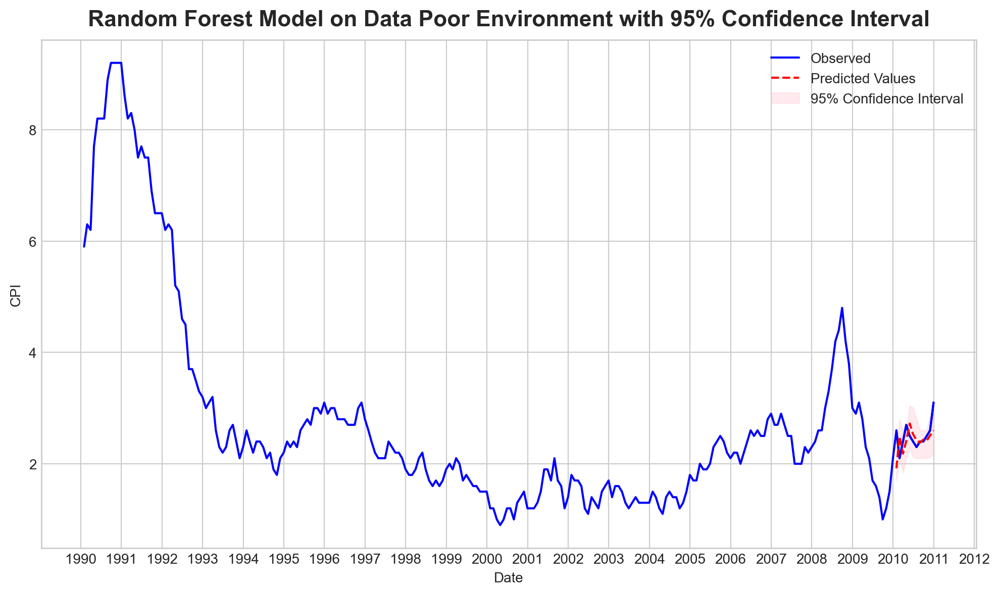

In [134]:
# Get predictions from all trees
all_tree_predictions = [tree.predict(X_test) for tree in reg_rf_best.estimators_]

# Transpose to have each instance's predictions in one array
all_tree_predictions = np.transpose(all_tree_predictions)

# Calculate the percentiles for each instance
lower_bound = np.percentile(all_tree_predictions, 2.5, axis=1)
upper_bound = np.percentile(all_tree_predictions, 97.5, axis=1)

# Now, plot everything
plt.figure(figsize=(10, 6))

# Plotting the entire dataset's true values
plt.plot(date_range, true_values_all, label='Observed', color='blue')

# Highlighting the test set's true values
plt.plot(test_dates, true_values_test, color='blue')
#, label='Test Set True Values'
# Plotting the predictions for the test set
plt.plot(test_dates, yhat_rf_best, label='Predicted Values', color='red', linestyle='--')

# Plotting the confidence intervals
plt.fill_between(test_dates, lower_bound, upper_bound, color='pink', alpha=0.3,label='95% Confidence Interval')
#, label='95% Confidence Interval'

# Formatting the x-axis to show years
plt.gca().xaxis.set_major_formatter(mdates.DateFormatter('%Y'))
plt.gca().xaxis.set_major_locator(mdates.YearLocator())

plt.title('Random Forest Model on Data Poor Environment with 95% Confidence Interval')
plt.legend()
plt.xlabel('Date')
plt.ylabel('CPI')
plt.tight_layout()
plt.grid(True)
plt.show()

## XGBOOST on Data Rich

In [135]:
!pip install xgboost

Defaulting to user installation because normal site-packages is not writeable


In [136]:

import xgboost as xgb

In [138]:
X_train = train[['unemployment','interest','exports','imports','moneysupply','ppi', 'y_lag_1', 'y_lag_2', 'y_lag_3',
       'y_lag_4', 'y_lag_5', 'y_lag_6', 'y_lag_7', 'y_lag_8', 'y_lag_9',
       'y_lag_10', 'y_lag_11', 'y_lag_12', 'y_lag_13']]
y_train = train['inflation']
X_test=test[['unemployment','interest','exports','imports','moneysupply','ppi','y_lag_1', 'y_lag_2', 'y_lag_3',
       'y_lag_4', 'y_lag_5', 'y_lag_6', 'y_lag_7', 'y_lag_8', 'y_lag_9',
       'y_lag_10', 'y_lag_11', 'y_lag_12', 'y_lag_13']]
y_test=test['inflation']

In [110]:
import xgboost as xgb
from sklearn.model_selection import RandomizedSearchCV

# Define the hyperparameter grid
param_grid = {
    'learning_rate': [ 0.05, 0.1, 0.2],
    'n_estimators': [100, 500, 1000],
    'max_depth': [3, 5, 7]
}

# Create an XGBoost regressor object
xgb_reg = xgb.XGBRegressor(objective='reg:squarederror')

# Create the RandomizedSearchCV object
random_search = RandomizedSearchCV(
    xgb_reg, 
    param_distributions=param_grid, 
    n_iter=50,  # number of combinations to try
    scoring='neg_mean_squared_error', 
    cv=5, 
    verbose=2, 
    random_state=42, 
    n_jobs=-1
)

# Fit to the data
random_search.fit(X_train, y_train)

# Extract the best parameters and estimator
best_params = random_search.best_params_
best_estimator = random_search.best_estimator_

print("Best parameters found: ", best_params)


Fitting 5 folds for each of 27 candidates, totalling 135 fits


RandomizedSearchCV(cv=5,
                   estimator=XGBRegressor(base_score=None, booster=None,
                                          callbacks=None,
                                          colsample_bylevel=None,
                                          colsample_bynode=None,
                                          colsample_bytree=None,
                                          early_stopping_rounds=None,
                                          enable_categorical=False,
                                          eval_metric=None, feature_types=None,
                                          gamma=None, gpu_id=None,
                                          grow_policy=None,
                                          importance_type=None,
                                          interaction_constraints=None,
                                          learning_rate=...
                                          max_delta_step=None, max_depth=None,
                                          max_leaves=None,
                                          min_child_weight=None, missing=nan,
                                          monotone_constraints=None,
                                          n_estimators=100, n_jobs=None,
                                          num_parallel_tree=None,
                                          predictor=None, random_state=None, ...),
                   n_iter=50, n_jobs=-1,
                   param_distributions={'learning_rate': [0.05, 0.1, 0.2],
                                        'max_depth': [3, 5, 7],
                                        'n_estimators': [100, 500, 1000]},
                   random_state=42, scoring='neg_mean_squared_error',
                   verbose=2)

Best parameters found:  {'n_estimators': 500, 'max_depth': 7, 'learning_rate': 0.1}


In [113]:
import xgboost as xgb
from sklearn.model_selection import RandomizedSearchCV

# Define the hyperparameter grid
param_grid = {
    'objective': ['reg:squarederror'],
    'learning_rate': [0.05, 0.1, 0.2],
    'n_estimators': [100, 500, 1000],
    'max_depth': [3, 5, 7],
    'subsample': [0.7, 0.8, 0.9],
    'colsample_bytree': [0.7, 0.8, 0.9],
    'gamma': [0, 0.1, 0.2],
    'alpha': [0, 0.1, 0.2],
    'lambda_': [0.8, 1, 1.2]
}

# Create an XGBoost regressor object
xgb_reg = xgb.XGBRegressor()

# Create the RandomizedSearchCV object
random_search = RandomizedSearchCV(
    xgb_reg, 
    param_distributions=param_grid, 
    n_iter=50,  # number of combinations to try
    scoring='neg_mean_squared_error', 
    cv=5, 
    verbose=2, 
    random_state=42, 
    n_jobs=-1
)

# Fit to the data
random_search.fit(X_train, y_train)

# Extract the best parameters and estimator
best_params = random_search.best_params_
best_estimator = random_search.best_estimator_

print("Best parameters found: ", best_params)


Fitting 5 folds for each of 50 candidates, totalling 250 fits
[17:06:30] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0fdc6d574b9c0d168-1\xgboost\xgboost-ci-windows\src\learner.cc:767: 
Parameters: { "lambda_" } are not used.



RandomizedSearchCV(cv=5,
                   estimator=XGBRegressor(base_score=None, booster=None,
                                          callbacks=None,
                                          colsample_bylevel=None,
                                          colsample_bynode=None,
                                          colsample_bytree=None,
                                          early_stopping_rounds=None,
                                          enable_categorical=False,
                                          eval_metric=None, feature_types=None,
                                          gamma=None, gpu_id=None,
                                          grow_policy=None,
                                          importance_type=None,
                                          interaction_constraints=None,
                                          learning_rate=...
                                          predictor=None, random_state=None, ...),
                   n_iter=50, n_jobs=-1,
                   param_distributions={'alpha': [0, 0.1, 0.2],
                                        'colsample_bytree': [0.7, 0.8, 0.9],
                                        'gamma': [0, 0.1, 0.2],
                                        'lambda_': [0.8, 1, 1.2],
                                        'learning_rate': [0.05, 0.1, 0.2],
                                        'max_depth': [3, 5, 7],
                                        'n_estimators': [100, 500, 1000],
                                        'objective': ['reg:squarederror'],
                                        'subsample': [0.7, 0.8, 0.9]},
                   random_state=42, scoring='neg_mean_squared_error',
                   verbose=2)

Best parameters found:  {'subsample': 0.8, 'objective': 'reg:squarederror', 'n_estimators': 500, 'max_depth': 5, 'learning_rate': 0.2, 'lambda_': 1.2, 'gamma': 0.1, 'colsample_bytree': 0.9, 'alpha': 0.1}


In [139]:
# Adjusting the code with the suggested hyperparameters

# Define the XGBoost regressor with the suggested hyperparameters
reg = xgb.XGBRegressor(
    objective='reg:squarederror',
    learning_rate=0.1,
    n_estimators=500,
    max_depth=7,

)


# Train the model
reg.fit(X_train, y_train, verbose=False)

# Predict on the test set
yhat = reg.predict(X_test)

# Return a sample of the predictions
yhat[:10]


XGBRegressor(base_score=None, booster=None, callbacks=None,
             colsample_bylevel=None, colsample_bynode=None,
             colsample_bytree=None, early_stopping_rounds=None,
             enable_categorical=False, eval_metric=None, feature_types=None,
             gamma=None, gpu_id=None, grow_policy=None, importance_type=None,
             interaction_constraints=None, learning_rate=0.1, max_bin=None,
             max_cat_threshold=None, max_cat_to_onehot=None,
             max_delta_step=None, max_depth=7, max_leaves=None,
             min_child_weight=None, missing=nan, monotone_constraints=None,
             n_estimators=500, n_jobs=None, num_parallel_tree=None,
             predictor=None, random_state=None, ...)

array([2.2161677, 2.431827 , 2.3060126, 2.2891324, 2.7106743, 2.4998732,
       2.4151342, 2.4070485, 2.4496558, 2.3790026], dtype=float32)

In [140]:

# Recompute the metrics with the necessary libraries loaded

# 1. Mean Squared Error (MSE)
mse_rf = mean_squared_error(y_test, yhat)

# 2. Mean Model Error
model_error_rf = y_test - yhat
mean_model_error_rf = model_error_rf.mean()

# 3. Root Mean Squared Error (RMSE)
rms_rf = sqrt(mean_squared_error(y_test, yhat))

# 4. R^2 (R-squared)
mean_actual_rf = np.mean(y_test)
ssr_rf = np.sum((yhat - y_test) ** 2)
sst_rf = np.sum((y_test - mean_actual_rf) ** 2)
r_squared_rf = 1 - (ssr_rf / sst_rf)

# 5. Mean Absolute Percentage Error (MAPE)
absolute_percentage_errors_rf = np.abs((y_test - yhat) / y_test)
mape_rf = np.mean(absolute_percentage_errors_rf) * 100

print('MSE: ', mse_rf)
print('Mean Model Error: ', mean_model_error_rf)
print('RMSE',rms_rf)
      
print('R-squared:', r_squared_rf)
print('MAPE:', mape_rf)


MSE:  0.0646548044998277
Mean Model Error:  0.06605919202168782
RMSE 0.2542730903965807
R-squared: -0.17554189999686698
MAPE: 7.865843598712504


In [141]:
# Get feature importances
importances = reg.feature_importances_

# Get feature names
feature_names = X_train.columns

# Pair feature names with their importance values
feature_importance_dict = dict(zip(feature_names, importances))

# Sort features based on importance
sorted_feature_importance = sorted(feature_importance_dict.items(), key=lambda x: x[1], reverse=True)

# Display the sorted features and their importances
for feature, importance in sorted_feature_importance:
    print(f"Feature: {feature}, Importance: {importance}")


Feature: moneysupply, Importance: 0.6029577851295471
Feature: y_lag_1, Importance: 0.3446418046951294
Feature: interest, Importance: 0.023829150944948196
Feature: y_lag_2, Importance: 0.016136761754751205
Feature: ppi, Importance: 0.003983087372034788
Feature: unemployment, Importance: 0.002327859401702881
Feature: y_lag_3, Importance: 0.0014902276452630758
Feature: y_lag_12, Importance: 0.000720937387086451
Feature: y_lag_7, Importance: 0.0006691248854622245
Feature: exports, Importance: 0.0005641879397444427
Feature: y_lag_8, Importance: 0.0005475858342833817
Feature: y_lag_9, Importance: 0.00041690608486533165
Feature: imports, Importance: 0.00037298069219104946
Feature: y_lag_10, Importance: 0.0003678243374451995
Feature: y_lag_11, Importance: 0.0003276704519521445
Feature: y_lag_4, Importance: 0.00021371339971665293
Feature: y_lag_5, Importance: 0.000171844512806274
Feature: y_lag_6, Importance: 0.00014804620877839625
Feature: y_lag_13, Importance: 0.00011246750364080071


In [148]:
X_trainf= train[['unemployment','interest','moneysupply','ppi', 'y_lag_1', 'y_lag_2', 'y_lag_3']]
y_trainf = train['inflation']
X_testf=test[['unemployment','interest','moneysupply','ppi', 'y_lag_1', 'y_lag_2', 'y_lag_3']]
y_testf=test['inflation']

In [151]:
# Adjusting the code with the suggested hyperparameters

# Define the XGBoost regressor with the suggested hyperparameters
regf =xgb.XGBRegressor(
    objective='reg:squarederror',
    learning_rate=0.1,
    n_estimators=500,
    max_depth=7,

)

# Train the model
regf.fit(X_trainf, y_trainf, verbose=False)

# Predict on the test set
yhatf = regf.predict(X_testf)

# Return a sample of the predictions
yhatf[:10]


XGBRegressor(base_score=None, booster=None, callbacks=None,
             colsample_bylevel=None, colsample_bynode=None,
             colsample_bytree=None, early_stopping_rounds=None,
             enable_categorical=False, eval_metric=None, feature_types=None,
             gamma=None, gpu_id=None, grow_policy=None, importance_type=None,
             interaction_constraints=None, learning_rate=0.1, max_bin=None,
             max_cat_threshold=None, max_cat_to_onehot=None,
             max_delta_step=None, max_depth=7, max_leaves=None,
             min_child_weight=None, missing=nan, monotone_constraints=None,
             n_estimators=500, n_jobs=None, num_parallel_tree=None,
             predictor=None, random_state=None, ...)

array([2.2356455, 2.5829556, 2.2904027, 2.5585117, 2.8511882, 2.5800269,
       2.4830825, 2.48537  , 2.4856741, 2.4793828], dtype=float32)

In [152]:

# Recompute the metrics with the necessary libraries loaded

# 1. Mean Squared Error (MSE)
mse_rf = mean_squared_error(y_test, yhatf)

# 2. Mean Model Error
model_error_rf = y_test - yhatf
mean_model_error_rf = model_error_rf.mean()

# 3. Root Mean Squared Error (RMSE)
rms_rf = sqrt(mean_squared_error(y_test, yhatf))

# 4. R^2 (R-squared)
mean_actual_rf = np.mean(y_test)
ssr_rf = np.sum((yhatf - y_test) ** 2)
sst_rf = np.sum((y_test - mean_actual_rf) ** 2)
r_squared_rf = 1 - (ssr_rf / sst_rf)

# 5. Mean Absolute Percentage Error (MAPE)
absolute_percentage_errors_rf = np.abs((y_test - yhatf) / y_test)
mape_rf = np.mean(absolute_percentage_errors_rf) * 100

print('MSE: ', mse_rf)
print('Mean Model Error: ', mean_model_error_rf)
print('RMSE',rms_rf)
      
print('R-squared:', r_squared_rf)
print('MAPE:', mape_rf)


MSE:  0.06582619370389182
Mean Model Error:  -0.025594770908355713
RMSE 0.2565661585320477
R-squared: -0.1968398855253055
MAPE: 8.212625960592808


<Figure size 1000x600 with 0 Axes>

Text(0.5, 1.0, 'Data Rich XGBoost Model Forecast')

Text(0.5, 0, 'Date')

Text(0, 0.5, 'CPI')

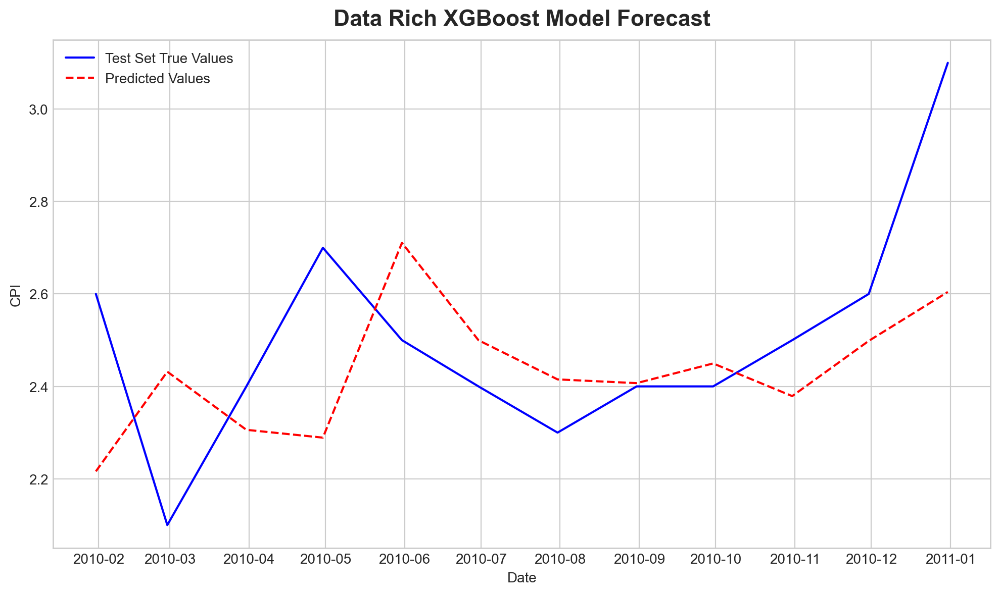

In [156]:
plt.figure(figsize=(10, 6))

# Highlighting the test set's true values
plt.plot(test_dates, true_values_test, color='blue', label='Test Set True Values')

# Plotting the predictions for the test set
plt.plot(test_dates, yhat, label='Predicted Values', color='red', linestyle='--')

# Formatting the x-axis to show years
plt.gca().xaxis.set_major_formatter(mdates.DateFormatter('%Y-%m'))
plt.gca().xaxis.set_major_locator(mdates.MonthLocator())

plt.title('Data Rich XGBoost Model Forecast')
plt.legend()
plt.xlabel('Date')
plt.ylabel('CPI')
plt.tight_layout()
plt.grid(True)
plt.show()

## XGBOOST on Data poor

In [166]:
X_train = train[['unemployment','interest','ppi', 'y_lag_1', 'y_lag_2', 'y_lag_3',
       'y_lag_4', 'y_lag_5', 'y_lag_6', 'y_lag_7', 'y_lag_8', 'y_lag_9',
       'y_lag_10', 'y_lag_11', 'y_lag_12', 'y_lag_13']]
y_train = train['inflation']
X_test=test[['unemployment','interest','ppi','y_lag_1', 'y_lag_2', 'y_lag_3',
       'y_lag_4', 'y_lag_5', 'y_lag_6', 'y_lag_7', 'y_lag_8', 'y_lag_9',
       'y_lag_10', 'y_lag_11', 'y_lag_12', 'y_lag_13']]
y_test=test['inflation']

In [386]:
import xgboost as xgb
from sklearn.model_selection import RandomizedSearchCV

# Define the hyperparameter grid
param_grid = {
    'learning_rate': [ 0.05, 0.1, 0.2],
    'n_estimators': [100, 500, 1000],
    'max_depth': [3, 5, 7]
}

# Create an XGBoost regressor object
xgb_reg = xgb.XGBRegressor(objective='reg:squarederror')

# Create the RandomizedSearchCV object
random_search = RandomizedSearchCV(
    xgb_reg, 
    param_distributions=param_grid, 
    n_iter=50,  # number of combinations to try
    scoring='neg_mean_squared_error', 
    cv=5, 
    verbose=2, 
    random_state=42, 
    n_jobs=-1
)

# Fit to the data
random_search.fit(X_train, y_train)

# Extract the best parameters and estimator
best_params = random_search.best_params_
best_estimator = random_search.best_estimator_

print("Best parameters found: ", best_params)


Fitting 5 folds for each of 27 candidates, totalling 135 fits


RandomizedSearchCV(cv=5,
                   estimator=XGBRegressor(base_score=None, booster=None,
                                          callbacks=None,
                                          colsample_bylevel=None,
                                          colsample_bynode=None,
                                          colsample_bytree=None,
                                          early_stopping_rounds=None,
                                          enable_categorical=False,
                                          eval_metric=None, feature_types=None,
                                          gamma=None, gpu_id=None,
                                          grow_policy=None,
                                          importance_type=None,
                                          interaction_constraints=None,
                                          learning_rate=...
                                          max_delta_step=None, max_depth=None,
                                          max_leaves=None,
                                          min_child_weight=None, missing=nan,
                                          monotone_constraints=None,
                                          n_estimators=100, n_jobs=None,
                                          num_parallel_tree=None,
                                          predictor=None, random_state=None, ...),
                   n_iter=50, n_jobs=-1,
                   param_distributions={'learning_rate': [0.05, 0.1, 0.2],
                                        'max_depth': [3, 5, 7],
                                        'n_estimators': [100, 500, 1000]},
                   random_state=42, scoring='neg_mean_squared_error',
                   verbose=2)

Best parameters found:  {'n_estimators': 100, 'max_depth': 5, 'learning_rate': 0.1}


In [167]:
# Adjusting the code with the suggested hyperparameters

# Define the XGBoost regressor with the suggested hyperparameters
reg = xgb.XGBRegressor(
    objective='reg:squarederror',
    learning_rate=0.1,
    n_estimators=100,
    max_depth=5,
    subsample=0.8,
    colsample_bytree=0.8,
    gamma=0.1,
    alpha=0.1,
    lambda_=1
)

# Train the model
reg.fit(X_train, y_train, verbose=False)

# Predict on the test set
yhat = reg.predict(X_test)

# Return a sample of the predictions
yhat[:10]


[17:11:58] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0fdc6d574b9c0d168-1\xgboost\xgboost-ci-windows\src\learner.cc:767: 
Parameters: { "lambda_" } are not used.



XGBRegressor(alpha=0.1, base_score=None, booster=None, callbacks=None,
             colsample_bylevel=None, colsample_bynode=None,
             colsample_bytree=0.8, early_stopping_rounds=None,
             enable_categorical=False, eval_metric=None, feature_types=None,
             gamma=0.1, gpu_id=None, grow_policy=None, importance_type=None,
             interaction_constraints=None, lambda_=1, learning_rate=0.1,
             max_bin=None, max_cat_threshold=None, max_cat_to_onehot=None,
             max_delta_step=None, max_depth=5, max_leaves=None,
             min_child_weight=None, missing=nan, monotone_constraints=None,
             n_estimators=100, n_jobs=None, num_parallel_tree=None, ...)

array([1.9563127, 2.2718232, 2.101376 , 2.2371671, 2.662424 , 2.4862578,
       2.4474494, 2.4853358, 2.5705023, 2.494409 ], dtype=float32)

In [168]:

# Recompute the metrics with the necessary libraries loaded

# 1. Mean Squared Error (MSE)
mse_rf = mean_squared_error(y_test, yhat)

# 2. Mean Model Error
model_error_rf = y_test - yhat
mean_model_error_rf = model_error_rf.mean()

# 3. Root Mean Squared Error (RMSE)
rms_rf = sqrt(mean_squared_error(y_test, yhat))

# 4. R^2 (R-squared)
mean_actual_rf = np.mean(y_test)
ssr_rf = np.sum((yhat - y_test) ** 2)
sst_rf = np.sum((y_test - mean_actual_rf) ** 2)
r_squared_rf = 1 - (ssr_rf / sst_rf)

# 5. Mean Absolute Percentage Error (MAPE)
absolute_percentage_errors_rf = np.abs((y_test - yhat) / y_test)
mape_rf = np.mean(absolute_percentage_errors_rf) * 100

print('MSE: ', mse_rf)
print('Mean Model Error: ', mean_model_error_rf)
print('RMSE',rms_rf)
      
print('R-squared:', r_squared_rf)
print('MAPE:', mape_rf)


MSE:  0.07481162287368556
Mean Model Error:  0.0700878103574117
RMSE 0.273517134515711
R-squared: -0.36021132497610053
MAPE: 8.181986616486062


In [169]:
# Get feature importances
importances = reg.feature_importances_

# Get feature names
feature_names = X_train.columns

# Pair feature names with their importance values
feature_importance_dict = dict(zip(feature_names, importances))

# Sort features based on importance
sorted_feature_importance = sorted(feature_importance_dict.items(), key=lambda x: x[1], reverse=True)

# Display the sorted features and their importances
for feature, importance in sorted_feature_importance:
    print(f"Feature: {feature}, Importance: {importance}")


Feature: interest, Importance: 0.42645928263664246
Feature: y_lag_1, Importance: 0.3611726760864258
Feature: y_lag_2, Importance: 0.11061166971921921
Feature: y_lag_3, Importance: 0.02885996364057064
Feature: unemployment, Importance: 0.020517893135547638
Feature: y_lag_13, Importance: 0.018234090879559517
Feature: ppi, Importance: 0.008796678856015205
Feature: y_lag_12, Importance: 0.00397277669981122
Feature: y_lag_9, Importance: 0.003582546953111887
Feature: y_lag_7, Importance: 0.0034617262426763773
Feature: y_lag_8, Importance: 0.0030830467585474253
Feature: y_lag_5, Importance: 0.002633253112435341
Feature: y_lag_4, Importance: 0.0025346262846142054
Feature: y_lag_11, Importance: 0.0021878310944885015
Feature: y_lag_6, Importance: 0.0020035794004797935
Feature: y_lag_10, Importance: 0.0018883423181250691


In [170]:
X_trainf = train[['unemployment','interest','ppi', 'y_lag_1', 'y_lag_2', 'y_lag_3','y_lag_4','y_lag_5', 'y_lag_7', 'y_lag_8', 'y_lag_9','y_lag_12', 'y_lag_13'
       ]]
y_trainf = train['inflation']
X_testf=test[['unemployment','interest','ppi', 'y_lag_1', 'y_lag_2', 'y_lag_3','y_lag_4','y_lag_5', 'y_lag_7', 'y_lag_8', 'y_lag_9','y_lag_12', 'y_lag_13'
       ]]
y_testf=test['inflation']

In [173]:
# Adjusting the code with the suggested hyperparameters

# Define the XGBoost regressor with the suggested hyperparameters
regf = xgb.XGBRegressor(
    objective='reg:squarederror',
    learning_rate=0.1,
    n_estimators=100,
    max_depth=5,
    subsample=0.8,
    colsample_bytree=0.8,
    gamma=0.1,
    alpha=0.1,
    lambda_=1
)

# Train the model
regf.fit(X_trainf, y_trainf, verbose=False)

# Predict on the test set
yhatf = regf.predict(X_testf)

# Return a sample of the predictions
yhatf[:10]


[17:40:08] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0fdc6d574b9c0d168-1\xgboost\xgboost-ci-windows\src\learner.cc:767: 
Parameters: { "lambda_" } are not used.



XGBRegressor(alpha=0.1, base_score=None, booster=None, callbacks=None,
             colsample_bylevel=None, colsample_bynode=None,
             colsample_bytree=0.8, early_stopping_rounds=None,
             enable_categorical=False, eval_metric=None, feature_types=None,
             gamma=0.1, gpu_id=None, grow_policy=None, importance_type=None,
             interaction_constraints=None, lambda_=1, learning_rate=0.1,
             max_bin=None, max_cat_threshold=None, max_cat_to_onehot=None,
             max_delta_step=None, max_depth=5, max_leaves=None,
             min_child_weight=None, missing=nan, monotone_constraints=None,
             n_estimators=100, n_jobs=None, num_parallel_tree=None, ...)

array([1.9133232, 2.3717294, 2.256443 , 2.336389 , 2.6752346, 2.4910893,
       2.3941038, 2.4013286, 2.522366 , 2.4179828], dtype=float32)

In [174]:

# Recompute the metrics with the necessary libraries loaded

# 1. Mean Squared Error (MSE)
mse_rf = mean_squared_error(y_test, yhatf)

# 2. Mean Model Error
model_error_rf = y_test - yhatf
mean_model_error_rf = model_error_rf.mean()

# 3. Root Mean Squared Error (RMSE)
rms_rf = sqrt(mean_squared_error(y_test, yhatf))

# 4. R^2 (R-squared)
mean_actual_rf = np.mean(y_test)
ssr_rf = np.sum((yhatf - y_test) ** 2)
sst_rf = np.sum((y_test - mean_actual_rf) ** 2)
r_squared_rf = 1 - (ssr_rf / sst_rf)

# 5. Mean Absolute Percentage Error (MAPE)
absolute_percentage_errors_rf = np.abs((y_test - yhatf) / y_test)
mape_rf = np.mean(absolute_percentage_errors_rf) * 100

print('MSE: ', mse_rf)
print('Mean Model Error: ', mean_model_error_rf)
print('RMSE',rms_rf)
      
print('R-squared:', r_squared_rf)
print('MAPE:', mape_rf)


MSE:  0.08463401938136678
Mean Model Error:  0.09339769681294759
RMSE 0.2909192660883201
R-squared: -0.5388003523884863
MAPE: 8.519466658267165


<Figure size 1000x600 with 0 Axes>

Text(0.5, 1.0, 'Data Poor XGBoost Model Forecast')

Text(0.5, 0, 'Date')

Text(0, 0.5, 'CPI')

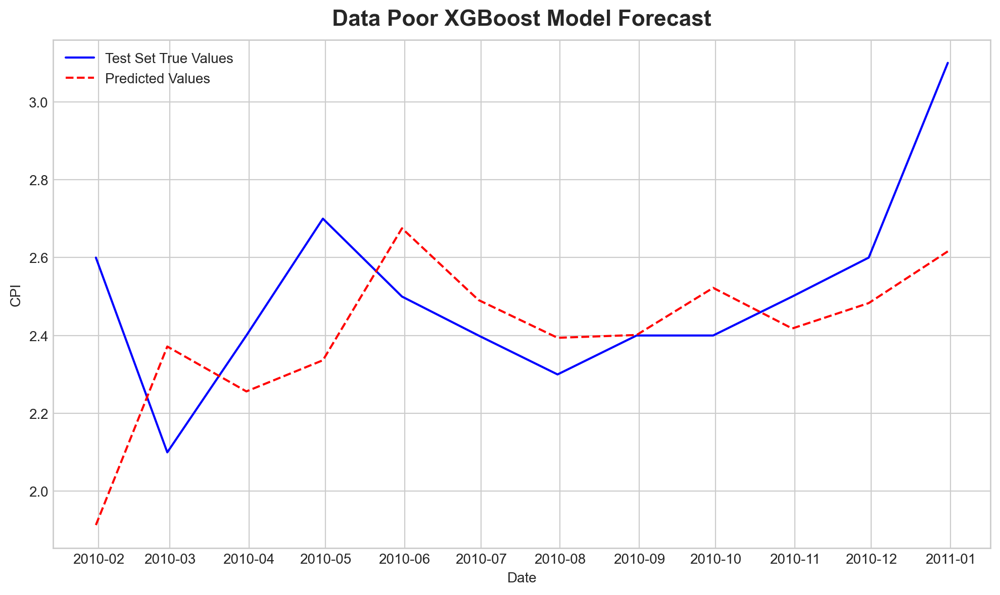

In [175]:


plt.figure(figsize=(10, 6))

# Highlighting the test set's true values
plt.plot(test_dates, true_values_test, color='blue', label='Test Set True Values')

# Plotting the predictions for the test set
plt.plot(test_dates, yhatf, label='Predicted Values', color='red', linestyle='--')

# Formatting the x-axis to show years
plt.gca().xaxis.set_major_formatter(mdates.DateFormatter('%Y-%m'))
plt.gca().xaxis.set_major_locator(mdates.MonthLocator())

plt.title('Data Poor XGBoost Model Forecast')
plt.legend()
plt.xlabel('Date')
plt.ylabel('CPI')
plt.tight_layout()
plt.grid(True)
plt.show()


## Light GBM -Data Poor

In [172]:
X_train = train[['unemployment','interest','ppi', 'y_lag_1', 'y_lag_2', 'y_lag_3',
       'y_lag_4', 'y_lag_5', 'y_lag_6', 'y_lag_7', 'y_lag_8', 'y_lag_9',
       'y_lag_10', 'y_lag_11', 'y_lag_12', 'y_lag_13']]
y_train = train['inflation']
X_test=test[['unemployment','interest','ppi','y_lag_1', 'y_lag_2', 'y_lag_3',
       'y_lag_4', 'y_lag_5', 'y_lag_6', 'y_lag_7', 'y_lag_8', 'y_lag_9',
       'y_lag_10', 'y_lag_11', 'y_lag_12', 'y_lag_13']]
y_test=test['inflation']

In [136]:
pip install lightgbm

Defaulting to user installation because normal site-packages is not writeableNote: you may need to restart the kernel to use updated packages.

     ---------------------------------------- 1.3/1.3 MB 2.9 MB/s eta 0:00:00


In [173]:
# Define parameter grid
param_grid = {
    'num_leaves': [31, 127],
    'reg_alpha': [0.1, 0.5],
    'min_data_in_leaf': [30, 50, 100, 300, 400],
    'lambda_l1': [0, 1, 1.5],
    'lambda_l2': [0, 1]
}

# Create a LightGBM model
lgb_estimator = lgb.LGBMRegressor(boosting_type='gbdt', objective='regression', n_jobs=5)

# Create GridSearchCV object
gsearch = GridSearchCV(estimator=lgb_estimator, param_grid=param_grid, cv=5)

# Fit the model
gsearch.fit(X_train, y_train)

# Get the best parameters and best score
print("Best parameters found by grid search are:", gsearch.best_params_)
print("Best score found by grid search is:", gsearch.best_score_)











[LightGBM] [Warning] min_data_in_leaf is set=30, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=30
[LightGBM] [Warning] lambda_l1 is set=0, reg_alpha=0.1 will be ignored. Current value: lambda_l1=0
[LightGBM] [Warning] lambda_l2 is set=0, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0
[LightGBM] [Warning] min_data_in_leaf is set=30, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=30
[LightGBM] [Warning] lambda_l1 is set=0, reg_alpha=0.1 will be ignored. Current value: lambda_l1=0
[LightGBM] [Warning] lambda_l2 is set=0, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000056 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 488
[LightGBM] [Info] Number of data points in the train set: 192, number of used features: 16
[LightGBM] [Info] Start training from score 2.058854
[LightGBM] [Warn

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[LightGBM] [Warning] lambda_l1 is set=0, reg_alpha=0.1 will be ignored. Current value: lambda_l1=0
[LightGBM] [Warning] lambda_l2 is set=0, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[LightGBM] [Warning] lambda_l1 is set=0, reg_alpha=0.5 will be ignored. Current value: lambda_l1=0
[LightGBM] [Warning] lambda_l2 is set=0, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[LightGBM] [Warning] lambda_l1 is set=0, reg_alpha=0.5 will be ignored. Current value: lambda_l1=0
[LightGBM] [Warning] lambda_l2 is set=0, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0
[LightGBM] [Warning] Auto-choosing co

[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] Stopped training because there are no more 

[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] lambda_l1 is set=0, reg_alpha=0.1 will be ignored. Current value: lambda_l1=0
[LightGBM] [Warning] lambda_l2 is set=0, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] lambda_l1 is set=0, reg_alpha=0.1 will be ignored. Current value: lambda_l1=0
[LightGBM] [Warning] lambda_l2 is set=0, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0
[LightGBM] [Warning] There are no meaningful features which satisfy the provided configuration. Decreasing Dataset parameters min_data_in_bin or min_data_in_leaf and re-constructing Dataset might resolve this warning.
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [

[LightGBM] [Warning] min_data_in_leaf is set=30, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=30
[LightGBM] [Warning] lambda_l1 is set=0, reg_alpha=0.5 will be ignored. Current value: lambda_l1=0
[LightGBM] [Warning] lambda_l2 is set=1, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1
[LightGBM] [Warning] min_data_in_leaf is set=30, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=30
[LightGBM] [Warning] lambda_l1 is set=0, reg_alpha=0.5 will be ignored. Current value: lambda_l1=0
[LightGBM] [Warning] lambda_l2 is set=1, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1
[LightGBM] [Warning] min_data_in_leaf is set=30, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=30
[LightGBM] [Warning] lambda_l1 is set=0, reg_alpha=0.5 will be ignored. Current value: lambda_l1=0
[LightGBM] [Warning] lambda_l2 is set=1, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1
[LightGBM] [Warning] Auto-choosing co

[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[LightGBM] [Warning] lambda_l1 is set=0, reg_alpha=0.5 will be ignored. Current value: lambda_l1=0
[LightGBM] [Warning] lambda_l2 is set=1, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[LightGBM] [Warning] lambda_l1 is set=0, reg_alpha=0.5 will be ignored. Current value: lambda_l1=0
[LightGBM] [Warning] lambda_l2 is set=1, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000044 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 587
[LightGBM] [Info] Number of data points in the train set: 192, number of used features: 16
[LightGBM] [Info] Start training from score 2.854167
[LightGBM] [Warn

[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[LightGBM] [Warning] lambda_l1 is set=0, reg_alpha=0.1 will be ignored. Current value: lambda_l1=0
[LightGBM] [Warning] lambda_l2 is set=1, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[LightGBM] [Warning] lambda_l1 is set=0, reg_alpha=0.1 will be ignored. Current value: lambda_l1=0
[LightGBM] [Warning] lambda_l2 is set=1, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1
[LightGBM] [Warning] There are no meaningful features which satisfy the provided configuration. Decreasing Dataset parameters min_data_in_bin or min_data_in_leaf and re-constructing Dataset might resolve this warning.
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[LightGBM] [

[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] lambda_l1 is set=0, reg_alpha=0.5 will be ignored. Current value: lambda_l1=0
[LightGBM] [Warning] lambda_l2 is set=1, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1
[LightGBM] [Warning] There are no meaningful features which satisfy the provided configuration. Decreasing Dataset parameters min_data_in_bin or min_data_in_leaf and re-constructing Dataset might resolve this warning.
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] lambda_l1 is set=0, reg_alpha=0.5 will be ignored. Current value: lambda_l1=0
[LightGBM] [Warning] lambda_l2 is set=1, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1
[LightGBM] [Info] Total Bins 0
[LightGBM] [Info] Number of data points in the train set: 192, number of used features: 0
[LightGBM] [Inf

[LightGBM] [Warning] min_data_in_leaf is set=30, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=30
[LightGBM] [Warning] lambda_l1 is set=1, reg_alpha=0.1 will be ignored. Current value: lambda_l1=1
[LightGBM] [Warning] lambda_l2 is set=0, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0
[LightGBM] [Warning] min_data_in_leaf is set=30, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=30
[LightGBM] [Warning] lambda_l1 is set=1, reg_alpha=0.1 will be ignored. Current value: lambda_l1=1
[LightGBM] [Warning] lambda_l2 is set=0, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000055 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 587
[LightGBM] [Info] Number of data points in the train set: 192, number of used features: 16
[LightGBM] [Info] Start training from score 2.854167
[LightGBM] [Warn

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[LightGBM] [Warning] lambda_l1 is set=1, reg_alpha=0.5 will be ignored. Current value: lambda_l1=1
[LightGBM] [Warning] lambda_l2 is set=0, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0
[LightGBM] [Info] Total Bins 0
[LightGBM] [Info] Number of data points in the train set: 192, number of used features: 0
[LightGBM] [Info] Start training from score 2.854167
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the sp

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



[LightGBM] [Warning] min_data_in_leaf is set=30, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=30
[LightGBM] [Warning] lambda_l1 is set=1.5, reg_alpha=0.5 will be ignored. Current value: lambda_l1=1.5
[LightGBM] [Warning] lambda_l2 is set=0, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0
[LightGBM] [Warning] min_data_in_leaf is set=30, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=30
[LightGBM] [Warning] lambda_l1 is set=1.5, reg_alpha=0.5 will be ignored. Current value: lambda_l1=1.5
[LightGBM] [Warning] lambda_l2 is set=0, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0
[LightGBM] [Warning] min_data_in_leaf is set=30, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=30
[LightGBM] [Warning] lambda_l1 is set=1.5, reg_alpha=0.5 will be ignored. Current value: lambda_l1=1.5
[LightGBM] [Warning] lambda_l2 is set=0, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0
[LightGBM] [Warning] Auto

[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[LightGBM] [Warning] lambda_l1 is set=1.5, reg_alpha=0.1 will be ignored. Current value: lambda_l1=1.5
[LightGBM] [Warning] lambda_l2 is set=0, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000058 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 587
[LightGBM] [Info] Number of data points in the train set: 192, number of used features: 16
[LightGBM] [Info] Start training from score 2.854167
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further s

[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[LightGBM] [Warning] lambda_l1 is set=1.5, reg_alpha=0.5 will be ignored. Current value: lambda_l1=1.5
[LightGBM] [Warning] lambda_l2 is set=0, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[LightGBM] [Warning] lambda_l1 is set=1.5, reg_alpha=0.5 will be ignored. Current value: lambda_l1=1.5
[LightGBM] [Warning] lambda_l2 is set=0, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[LightGBM] [Warning] lambda_l1 is set=1.5, reg_alpha=0.5 will be ignored. Current value: lambda_l1=1.5
[LightGBM] [Warning] lambda_l2 is set=0, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0
[LightGBM] [Warning] Auto

[LightGBM] [Warning] min_data_in_leaf is set=300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=300
[LightGBM] [Warning] lambda_l1 is set=1.5, reg_alpha=0.1 will be ignored. Current value: lambda_l1=1.5
[LightGBM] [Warning] lambda_l2 is set=0, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0
[LightGBM] [Info] Total Bins 0
[LightGBM] [Info] Number of data points in the train set: 192, number of used features: 0
[LightGBM] [Info] Start training from score 3.081250
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] Stopped training because there are no more leaves that meet th

[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] lambda_l1 is set=1.5, reg_alpha=0.1 will be ignored. Current value: lambda_l1=1.5
[LightGBM] [Warning] lambda_l2 is set=0, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0
[LightGBM] [Warning] There are no meaningful features which satisfy the provided configuration. Decreasing Dataset parameters min_data_in_bin or min_data_in_leaf and re-constructing Dataset might resolve this warning.
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] lambda_l1 is set=1.5, reg_alpha=0.1 will be ignored. Current value: lambda_l1=1.5
[LightGBM] [Warning] lambda_l2 is set=0, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0
[LightGBM] [Info] Total Bins 0
[LightGBM] [Info] Number of data points in the train set: 192, number of used features: 0
[LightG

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[LightGBM] [Warning] lambda_l1 is set=1.5, reg_alpha=0.5 will be ignored. Current value: lambda_l1=1.5
[LightGBM] [Warning] lambda_l2 is set=1, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[LightGBM] [Warning] lambda_l1 is set=1.5, reg_alpha=0.1 will be ignored. Current value: lambda_l1=1.5
[LightGBM] [Warning] lambda_l2 is set=1, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[LightGBM] [Warning] lambda_l1 is set=1.5, reg_alpha=0.1 will be ignored. Current value: lambda_l1=1.5
[LightGBM] [Warning] lambda_l2 is set=1, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1
[LightGBM] [Warning] Auto

[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[LightGBM] [Warning] lambda_l1 is set=1.5, reg_alpha=0.5 will be ignored. Current value: lambda_l1=1.5
[LightGBM] [Warning] lambda_l2 is set=1, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[LightGBM] [Warning] lambda_l1 is set=1.5, reg_alpha=0.5 will be ignored. Current value: lambda_l1=1.5
[LightGBM] [Warning] lambda_l2 is set=1, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1
[LightGBM] [Warning] There are no meaningful features which satisfy the provided configuration. Decreasing Dataset parameters min_data_in_bin or min_data_in_leaf and re-constructing Dataset might resolve this warning.
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[Lig

[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] lambda_l1 is set=1.5, reg_alpha=0.1 will be ignored. Current value: lambda_l1=1.5
[LightGBM] [Warning] lambda_l2 is set=1, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] lambda_l1 is set=1.5, reg_alpha=0.1 will be ignored. Current value: lambda_l1=1.5
[LightGBM] [Warning] lambda_l2 is set=1, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1
[LightGBM] [Warning] There are no meaningful features which satisfy the provided configuration. Decreasing Dataset parameters min_data_in_bin or min_data_in_leaf and re-constructing Dataset might resolve this warning.
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[Lig

GridSearchCV(cv=5, estimator=LGBMRegressor(n_jobs=5, objective='regression'),
             param_grid={'lambda_l1': [0, 1, 1.5], 'lambda_l2': [0, 1],
                         'min_data_in_leaf': [30, 50, 100, 300, 400],
                         'num_leaves': [31, 127], 'reg_alpha': [0.1, 0.5]})

Best parameters found by grid search are: {'lambda_l1': 1.5, 'lambda_l2': 0, 'min_data_in_leaf': 30, 'num_leaves': 31, 'reg_alpha': 0.1}
Best score found by grid search is: 0.15093923316503643


In [174]:
import lightgbm as lgb
best_lgb_model = gsearch.best_estimator_
yhat = best_lgb_model.predict(X_test)
# Return a sample of the predictions
yhat[:10]

[LightGBM] [Warning] min_data_in_leaf is set=30, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=30
[LightGBM] [Warning] lambda_l1 is set=1.5, reg_alpha=0.1 will be ignored. Current value: lambda_l1=1.5
[LightGBM] [Warning] lambda_l2 is set=0, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0


array([1.9621163 , 2.36003005, 2.11610002, 2.29377791, 2.9330848 ,
       2.67907591, 2.60166753, 2.73419134, 2.77636247, 2.83060766])

In [175]:
# Compute metrics
mse = mean_squared_error(y_test, yhat)
rmse = sqrt(mse)
r_squared = best_lgb_model.score(X_test, y_test)
mape = np.mean(np.abs((y_test - yhat) / y_test)) * 100

# Print metrics
print(f"MSE: {mse}")
print(f"RMSE: {rmse}")
print(f"R-squared: {r_squared}")
print(f"MAPE: {mape}")

[LightGBM] [Warning] min_data_in_leaf is set=30, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=30
[LightGBM] [Warning] lambda_l1 is set=1.5, reg_alpha=0.1 will be ignored. Current value: lambda_l1=1.5
[LightGBM] [Warning] lambda_l2 is set=0, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0
MSE: 0.13891368911392368
RMSE: 0.3727112677581987
R-squared: -1.525703438434975
MAPE: 14.3451045269717


In [176]:
# Extract feature importances from the fitted model
feature_importances = best_lgb_model.feature_importances_

# Get the feature names from the original dataframe
feature_names = X_train.columns

# Create a DataFrame to hold feature names and their corresponding importance scores
importance_df = pd.DataFrame({'Feature': feature_names, 'Importance': feature_importances})

# Sort the DataFrame by the importances in descending order
sorted_importance_df = importance_df.sort_values(by='Importance', ascending=False)



# Display the sorted features and their importances
for feature, importance in sorted_importance_df:
    print(f"Feature: {feature}, Importance: {importance}")

# Plot the feature importances
plt.figure(figsize=(10, 8))
plt.barh(sorted_importance_df['Feature'], sorted_importance_df['Importance'])
plt.xlabel('Importance')
plt.ylabel('Feature')
plt.title('Feature Importance')
plt.show()

ValueError: too many values to unpack (expected 2)

In [177]:
# Get feature importances
importances = best_lgb_model.feature_importances_

# Get feature names
feature_names = X_train.columns

# Pair feature names with their importance values
feature_importance_dict = dict(zip(feature_names, importances))

# Sort features based on importance
sorted_feature_importance = sorted(feature_importance_dict.items(), key=lambda x: x[1], reverse=True)

# Display the sorted features and their importances
for feature, importance in sorted_feature_importance:
    print(f"Feature: {feature}, Importance: {importance}")

Feature: ppi, Importance: 93
Feature: y_lag_1, Importance: 56
Feature: unemployment, Importance: 52
Feature: interest, Importance: 47
Feature: y_lag_13, Importance: 38
Feature: y_lag_12, Importance: 28
Feature: y_lag_3, Importance: 26
Feature: y_lag_4, Importance: 21
Feature: y_lag_6, Importance: 19
Feature: y_lag_7, Importance: 16
Feature: y_lag_8, Importance: 14
Feature: y_lag_2, Importance: 13
Feature: y_lag_11, Importance: 13
Feature: y_lag_5, Importance: 8
Feature: y_lag_10, Importance: 2
Feature: y_lag_9, Importance: 1


In [178]:
# Drop less important features from training and test sets
important_features = ['ppi', 'y_lag_1', 'unemployment', 'interest', 'y_lag_13', 
                      'y_lag_12', 'y_lag_3', 'y_lag_4', 'y_lag_6', 'y_lag_7', 
                      'y_lag_8', 'y_lag_2', 'y_lag_11', 'y_lag_5']

X_train_selected = X_train[important_features]
X_test_selected = X_test[important_features]

# Define new parameter grid
param_grid = {
    'num_leaves': [31, 127],
    'min_data_in_leaf': [30, 50],
    'lambda_l1': [0, 1],
    'lambda_l2': [0, 1]
}

# Create a LightGBM model
lgb_estimator = lgb.LGBMRegressor(boosting_type='gbdt', objective='regression', n_jobs=5)

# Create GridSearchCV object
gsearch = GridSearchCV(estimator=lgb_estimator, param_grid=param_grid, cv=5)

# Fit the model with selected important features
gsearch.fit(X_train_selected, y_train)

# ... (rest of the evaluation code remains the same)
print("Best parameters found by grid search are:", gsearch.best_params_)
print("Best score found by grid search is:", gsearch.best_score_)

[LightGBM] [Warning] min_data_in_leaf is set=30, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=30
[LightGBM] [Warning] lambda_l1 is set=0, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0
[LightGBM] [Warning] lambda_l2 is set=0, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0
[LightGBM] [Warning] min_data_in_leaf is set=30, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=30
[LightGBM] [Warning] lambda_l1 is set=0, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0
[LightGBM] [Warning] lambda_l2 is set=0, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000047 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 438
[LightGBM] [Info] Number of data points in the train set: 192, number of used features: 14
[LightGBM] [Info] Start training from score 2.058854
[LightGBM] [Warn

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[LightGBM] [Warning] lambda_l1 is set=1, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1
[LightGBM] [Warning] lambda_l2 is set=0, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[LightGBM] [Warning] lambda_l1 is set=1, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1
[LightGBM] [Warning] lambda_l2 is set=0, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[LightGBM] [Warning] lambda_l1 is set=1, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1
[LightGBM] [Warning] lambda_l2 is set=0, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0
[LightGBM] [Warning] Auto-choosing co

[LightGBM] [Warning] min_data_in_leaf is set=30, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=30
[LightGBM] [Warning] lambda_l1 is set=1, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1
[LightGBM] [Warning] lambda_l2 is set=1, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000084 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 494
[LightGBM] [Info] Number of data points in the train set: 192, number of used features: 14
[LightGBM] [Info] Start training from score 2.832292
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further split

GridSearchCV(cv=5, estimator=LGBMRegressor(n_jobs=5, objective='regression'),
             param_grid={'lambda_l1': [0, 1], 'lambda_l2': [0, 1],
                         'min_data_in_leaf': [30, 50],
                         'num_leaves': [31, 127]})

Best parameters found by grid search are: {'lambda_l1': 1, 'lambda_l2': 1, 'min_data_in_leaf': 30, 'num_leaves': 31}
Best score found by grid search is: 0.15184047141223872


In [179]:
import lightgbm as lgb
best_lgb_model = gsearch.best_estimator_
yhat = best_lgb_model.predict(X_test_selected)
# Return a sample of the predictions
yhat[:10]

[LightGBM] [Warning] min_data_in_leaf is set=30, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=30
[LightGBM] [Warning] lambda_l1 is set=1, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1
[LightGBM] [Warning] lambda_l2 is set=1, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1


array([1.9803836 , 2.33180183, 2.15470334, 2.29558433, 2.8912031 ,
       2.71297325, 2.66271114, 2.78910733, 2.81420848, 2.85994819])

In [180]:
# Compute metrics
mse = mean_squared_error(y_test, yhat)
rmse = sqrt(mse)
r_squared = best_lgb_model.score(X_test_selected, y_test)
mape = np.mean(np.abs((y_test - yhat) / y_test)) * 100

# Print metrics
print(f"MSE: {mse}")
print(f"RMSE: {rmse}")
print(f"R-squared: {r_squared}")
print(f"MAPE: {mape}")

[LightGBM] [Warning] min_data_in_leaf is set=30, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=30
[LightGBM] [Warning] lambda_l1 is set=1, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1
[LightGBM] [Warning] lambda_l2 is set=1, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1
MSE: 0.15008414139701445
RMSE: 0.3874069454682175
R-squared: -1.7288025708548074
MAPE: 14.953380343456926


In [182]:
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import GridSearchCV, TimeSeriesSplit
from sklearn.metrics import mean_squared_error
from math import sqrt
import numpy as np
import lightgbm as lgb

# Initialize the StandardScaler
scaler = StandardScaler()

# Fit on the training data and transform both the training and test data
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)

# Initialize TimeSeriesSplit with 5 splits
tscv = TimeSeriesSplit(n_splits=5)

# Define parameter grid
param_grid = {
    'num_leaves': [31, 127],
    'reg_alpha': [0.1, 0.5],
    'min_data_in_leaf': [30, 50],
    'lambda_l1': [0, 1],
    'lambda_l2': [0, 1]
}

# Create a LightGBM model
lgb_estimator = lgb.LGBMRegressor(boosting_type='gbdt', objective='regression', n_jobs=5)

# Create GridSearchCV object with TimeSeriesSplit
gsearch = GridSearchCV(estimator=lgb_estimator, param_grid=param_grid, cv=tscv)

# Fit the model
gsearch.fit(X_train_scaled, y_train)

# Get the best parameters and best score
print("Best parameters found by grid search are:", gsearch.best_params_)
print("Best score found by grid search is:", gsearch.best_score_)

# Use the best model to make predictions
best_lgb_model = gsearch.best_estimator_
yhat = best_lgb_model.predict(X_test_scaled)

# Compute metrics
mse = mean_squared_error(y_test, yhat)
rmse = sqrt(mse)
r_squared = best_lgb_model.score(X_test_scaled, y_test)
mape = np.mean(np.abs((y_test - yhat) / y_test)) * 100

# Print metrics
print(f"MSE: {mse}")
print(f"RMSE: {rmse}")
print(f"R-squared: {r_squared}")
print(f"MAPE: {mape}")


[LightGBM] [Warning] min_data_in_leaf is set=30, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=30
[LightGBM] [Warning] lambda_l1 is set=0, reg_alpha=0.1 will be ignored. Current value: lambda_l1=0
[LightGBM] [Warning] lambda_l2 is set=0, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0
[LightGBM] [Warning] There are no meaningful features which satisfy the provided configuration. Decreasing Dataset parameters min_data_in_bin or min_data_in_leaf and re-constructing Dataset might resolve this warning.
[LightGBM] [Warning] min_data_in_leaf is set=30, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=30
[LightGBM] [Warning] lambda_l1 is set=0, reg_alpha=0.1 will be ignored. Current value: lambda_l1=0
[LightGBM] [Warning] lambda_l2 is set=0, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0
[LightGBM] [Info] Total Bins 0
[LightGBM] [Info] Number of data points in the train set: 40, number of used features: 0
[LightGBM] [Info] St

[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[LightGBM] [Warning] lambda_l1 is set=0, reg_alpha=0.1 will be ignored. Current value: lambda_l1=0
[LightGBM] [Warning] lambda_l2 is set=0, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0
[LightGBM] [Warning] There are no meaningful features which satisfy the provided configuration. Decreasing Dataset parameters min_data_in_bin or min_data_in_leaf and re-constructing Dataset might resolve this warning.
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[LightGBM] [Warning] lambda_l1 is set=0, reg_alpha=0.1 will be ignored. Current value: lambda_l1=0
[LightGBM] [Warning] lambda_l2 is set=0, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0
[LightGBM] [Info] Total Bins 0
[LightGBM] [Info] Number of data points in the train set: 80, number of used features: 0
[LightGBM] [Info] St

[LightGBM] [Warning] min_data_in_leaf is set=30, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=30
[LightGBM] [Warning] lambda_l1 is set=0, reg_alpha=0.5 will be ignored. Current value: lambda_l1=0
[LightGBM] [Warning] lambda_l2 is set=1, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1
[LightGBM] [Warning] min_data_in_leaf is set=30, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=30
[LightGBM] [Warning] lambda_l1 is set=0, reg_alpha=0.5 will be ignored. Current value: lambda_l1=0
[LightGBM] [Warning] lambda_l2 is set=1, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000052 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 427
[LightGBM] [Info] Number of data points in the train set: 120, number of used features: 16
[LightGBM] [Info] Start training from score 3.624167
[LightGBM] [Warn

[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[LightGBM] [Warning] lambda_l1 is set=0, reg_alpha=0.5 will be ignored. Current value: lambda_l1=0
[LightGBM] [Warning] lambda_l2 is set=1, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000095 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 527
[LightGBM] [Info] Number of data points in the train set: 160, number of used features: 16
[LightGBM] [Info] Start training from score 3.072500
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further split

[LightGBM] [Warning] min_data_in_leaf is set=30, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=30
[LightGBM] [Warning] lambda_l1 is set=1, reg_alpha=0.1 will be ignored. Current value: lambda_l1=1
[LightGBM] [Warning] lambda_l2 is set=0, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0
[LightGBM] [Warning] min_data_in_leaf is set=30, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=30
[LightGBM] [Warning] lambda_l1 is set=1, reg_alpha=0.1 will be ignored. Current value: lambda_l1=1
[LightGBM] [Warning] lambda_l2 is set=0, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0
[LightGBM] [Warning] min_data_in_leaf is set=30, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=30
[LightGBM] [Warning] lambda_l1 is set=1, reg_alpha=0.1 will be ignored. Current value: lambda_l1=1
[LightGBM] [Warning] lambda_l2 is set=0, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0
[LightGBM] [Warning] Auto-choosing co

[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[LightGBM] [Warning] lambda_l1 is set=1, reg_alpha=0.5 will be ignored. Current value: lambda_l1=1
[LightGBM] [Warning] lambda_l2 is set=0, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[LightGBM] [Warning] lambda_l1 is set=1, reg_alpha=0.5 will be ignored. Current value: lambda_l1=1
[LightGBM] [Warning] lambda_l2 is set=0, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[LightGBM] [Warning] lambda_l1 is set=1, reg_alpha=0.5 will be ignored. Current value: lambda_l1=1
[LightGBM] [Warning] lambda_l2 is set=0, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0
[LightGBM] [Warning] Auto-choosing co

[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[LightGBM] [Warning] lambda_l1 is set=1, reg_alpha=0.1 will be ignored. Current value: lambda_l1=1
[LightGBM] [Warning] lambda_l2 is set=1, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[LightGBM] [Warning] lambda_l1 is set=1, reg_alpha=0.1 will be ignored. Current value: lambda_l1=1
[LightGBM] [Warning] lambda_l2 is set=1, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000044 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 427
[LightGBM] [Info] Number of data points in the train set: 120, number of used features: 16
[LightGBM] [Info] Start training from score 3.624167
[LightGBM] [Warn

GridSearchCV(cv=TimeSeriesSplit(gap=0, max_train_size=None, n_splits=5, test_size=None),
             estimator=LGBMRegressor(n_jobs=5, objective='regression'),
             param_grid={'lambda_l1': [0, 1], 'lambda_l2': [0, 1],
                         'min_data_in_leaf': [30, 50], 'num_leaves': [31, 127],
                         'reg_alpha': [0.1, 0.5]})

Best parameters found by grid search are: {'lambda_l1': 0, 'lambda_l2': 1, 'min_data_in_leaf': 30, 'num_leaves': 31, 'reg_alpha': 0.1}
Best score found by grid search is: -28.505488268404868
[LightGBM] [Warning] min_data_in_leaf is set=30, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=30
[LightGBM] [Warning] lambda_l1 is set=0, reg_alpha=0.1 will be ignored. Current value: lambda_l1=0
[LightGBM] [Warning] lambda_l2 is set=1, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1
[LightGBM] [Warning] min_data_in_leaf is set=30, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=30
[LightGBM] [Warning] lambda_l1 is set=0, reg_alpha=0.1 will be ignored. Current value: lambda_l1=0
[LightGBM] [Warning] lambda_l2 is set=1, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1
MSE: 0.11685588320297408
RMSE: 0.34184189796304093
R-squared: -1.1246524218722551
MAPE: 12.983925854841742


## GBM

In [276]:
X_train = train[['unemployment','interest','exports','imports','moneysupply','ppi', 'y_lag_1', 'y_lag_2', 'y_lag_3',
       'y_lag_4', 'y_lag_5', 'y_lag_6', 'y_lag_7', 'y_lag_8', 'y_lag_9',
       'y_lag_10', 'y_lag_11', 'y_lag_12', 'y_lag_13']]
y_train = train['inflation']
X_test=test[['unemployment','interest','exports','imports','moneysupply','ppi','y_lag_1', 'y_lag_2', 'y_lag_3',
       'y_lag_4', 'y_lag_5', 'y_lag_6', 'y_lag_7', 'y_lag_8', 'y_lag_9',
       'y_lag_10', 'y_lag_11', 'y_lag_12', 'y_lag_13']]
y_test=test['inflation']

X_columns=['unemployment','interest','exports','imports','moneysupply','ppi', 'y_lag_1', 'y_lag_2', 'y_lag_3',
       'y_lag_4', 'y_lag_5', 'y_lag_6', 'y_lag_7', 'y_lag_8', 'y_lag_9',
       'y_lag_10', 'y_lag_11', 'y_lag_12', 'y_lag_13']

In [272]:
from sklearn.ensemble import GradientBoostingRegressor
from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score

# Initialize the Gradient Boosting Regressor
gbm = GradientBoostingRegressor(random_state=42)

# Train the model
gbm.fit(X_train, y_train)

# Make predictions on the test set
y_pred = gbm.predict(X_test)

# Evaluate the model
mae = mean_absolute_error(y_test, y_pred)
mse = mean_squared_error(y_test, y_pred)
r2 = r2_score(y_test, y_pred)

mae, mse, r2


GradientBoostingRegressor(random_state=42)

(0.2598086985371027, 0.09088533607016193, -0.6524606558211254)

In [273]:
from sklearn.model_selection import GridSearchCV

# Define the hyperparameter grid
param_grid = {
    'n_estimators': [50, 100, 150],
    'learning_rate': [0.01, 0.05, 0.1],
    'max_depth': [3, 4, 5]
}

# Initialize the Gradient Boosting Regressor
gbm = GradientBoostingRegressor(random_state=42)

# Initialize Grid Search with 5-fold cross-validation
grid_search = GridSearchCV(estimator=gbm, param_grid=param_grid, 
                           cv=5, n_jobs=-1, verbose=2, scoring='neg_mean_squared_error')

# Perform Grid Search on the training data
grid_search.fit(X_train, y_train)

# Get the best parameters from the Grid Search
best_params = grid_search.best_params_
best_params


Fitting 5 folds for each of 27 candidates, totalling 135 fits


GridSearchCV(cv=5, estimator=GradientBoostingRegressor(random_state=42),
             n_jobs=-1,
             param_grid={'learning_rate': [0.01, 0.05, 0.1],
                         'max_depth': [3, 4, 5],
                         'n_estimators': [50, 100, 150]},
             scoring='neg_mean_squared_error', verbose=2)

{'learning_rate': 0.1, 'max_depth': 5, 'n_estimators': 150}

In [274]:
# Initialize the Gradient Boosting Regressor with the best parameters
gbm_best = GradientBoostingRegressor(learning_rate=best_params['learning_rate'],
                                     max_depth=best_params['max_depth'],
                                     n_estimators=best_params['n_estimators'],
                                     random_state=42)

# Train the model with the best parameters
gbm_best.fit(X_train, y_train)

# Make predictions on the test set
y_pred_best = gbm_best.predict(X_test)

# Evaluate the model with the best parameters
mae_best = mean_absolute_error(y_test, y_pred_best)
mse_best = mean_squared_error(y_test, y_pred_best)
r2_best = r2_score(y_test, y_pred_best)

mae_best, mse_best, r2_best


GradientBoostingRegressor(max_depth=5, n_estimators=150, random_state=42)

(0.24134097216747605, 0.08585863532295446, -0.5610660967809895)

<Figure size 1200x800 with 0 Axes>

<BarContainer object of 19 artists>

Text(0.5, 0, 'Importance')

Text(0, 0.5, 'Feature')

Text(0.5, 1.0, 'Feature Importance')

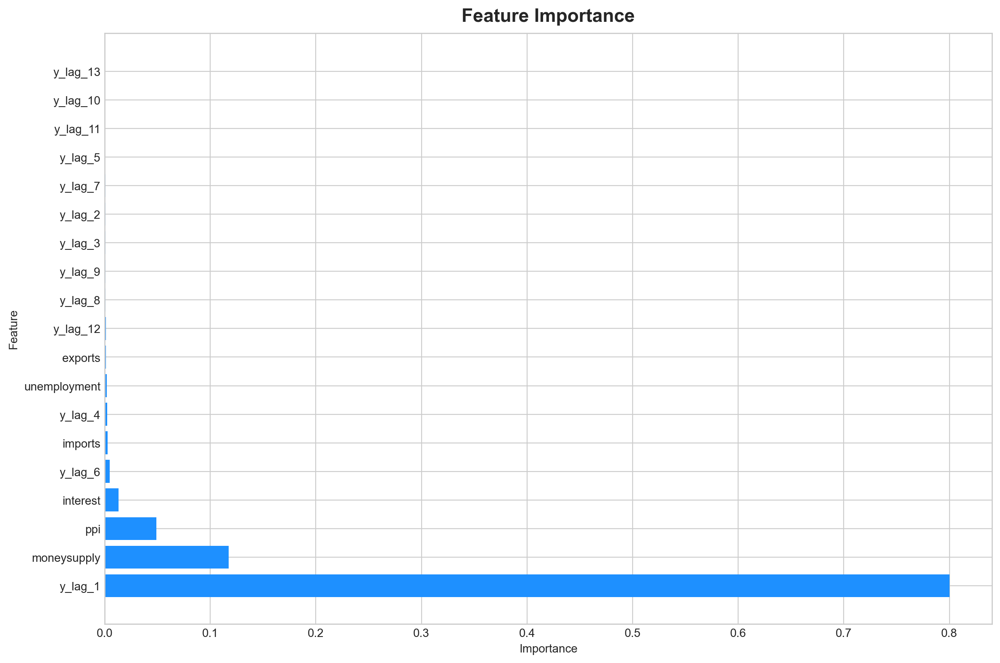

['y_lag_1', 'moneysupply', 'ppi', 'interest']

In [277]:
import matplotlib.pyplot as plt
import numpy as np

# Get feature importances from the trained model
feature_importances = gbm_best.feature_importances_

# Create a DataFrame to hold feature names and their importance scores
feature_importance_df = pd.DataFrame({
    'Feature': X_columns,
    'Importance': feature_importances
})

# Sort the features by importance
feature_importance_df = feature_importance_df.sort_values(by='Importance', ascending=False)

# Plot the feature importances
plt.figure(figsize=(12, 8))
plt.barh(feature_importance_df['Feature'], feature_importance_df['Importance'], color='dodgerblue')
plt.xlabel('Importance')
plt.ylabel('Feature')
plt.title('Feature Importance')
plt.show()

# Selecting features with importance greater than a threshold (e.g., 0.01)
selected_features = feature_importance_df[feature_importance_df['Importance'] > 0.01]['Feature'].tolist()
selected_features


In [279]:
# Subset the training and testing sets based on the selected features
X_train_selected = X_train[selected_features]
X_test_selected = X_test[selected_features]

# Train the model with the best parameters and selected features
gbm_best.fit(X_train_selected, y_train)

# Make predictions on the test set using selected features
y_pred_selected = gbm_best.predict(X_test_selected)

# Evaluate the model with the best parameters and selected features
mae_selected = mean_absolute_error(y_test, y_pred_selected)
mse_selected = mean_squared_error(y_test, y_pred_selected)
r2_selected = r2_score(y_test, y_pred_selected)

mae_selected, mse_selected, r2_selected


GradientBoostingRegressor(max_depth=5, n_estimators=150, random_state=42)

(0.24957673810234726, 0.08421951784729476, -0.5312639608599041)